#

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        (os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
import numpy as np
from PIL import Image
import os

# ------------------------
# SETTINGS
# ------------------------
dataset_dir = "/kaggle/input/alz-b-1100/alzheimer_new_11/alzheimer_new"  # Update path as needed
img_size = (128,128)

X = []
y = []

# --- Get all class folders (e.g., 4 classes) ---
class_names = sorted([d for d in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, d))])
print("✅ Classes found:", class_names)

if len(class_names) != 8:
    raise ValueError(f"Expected exactly 4 classes, found {len(class_names)}: {class_names}")

# --- Walk through each class and collect images ---
for idx, class_name in enumerate(class_names):
    class_path = os.path.join(dataset_dir, class_name)
    print(f"🔍 Processing class '{class_name}' ({idx})")

    for root, _, files in os.walk(class_path):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                img = Image.open(file_path).convert('RGB')
                img = img.resize(img_size)
                img_array = np.array(img) / 255.0  # Normalize
                X.append(img_array)
                y.append(idx)
            except Exception as e:
                print(f"⚠️ Failed to process {file_path}: {e}")

# ------------------------
# CONVERT TO NUMPY ARRAYS
# ------------------------
X = np.array(X, dtype=np.float32)
y = np.array(y, dtype=np.int32)

print(f"\n✅ Dataset loaded successfully:")
print(f"   X shape = {X.shape}")
print(f"   y shape = {y.shape}")
print(f"   Class mapping = {dict(enumerate(class_names))}")

# ------------------------
# SAVE AS .NPY FILES
# ------------------------
np.save("X.npy", X)
np.save("y.npy", y)
print("✅ Saved X.npy and y.npy to current working directory.")


✅ Classes found: ['MildDemented', 'Moderate Dementia', 'NonDemented', 'Very mild Dementia', 'glioma', 'meningioma', 'notumor', 'pituitary']
🔍 Processing class 'MildDemented' (0)
🔍 Processing class 'Moderate Dementia' (1)
🔍 Processing class 'NonDemented' (2)
🔍 Processing class 'Very mild Dementia' (3)
🔍 Processing class 'glioma' (4)
🔍 Processing class 'meningioma' (5)
🔍 Processing class 'notumor' (6)
🔍 Processing class 'pituitary' (7)

✅ Dataset loaded successfully:
   X shape = (8800, 128, 128, 3)
   y shape = (8800,)
   Class mapping = {0: 'MildDemented', 1: 'Moderate Dementia', 2: 'NonDemented', 3: 'Very mild Dementia', 4: 'glioma', 5: 'meningioma', 6: 'notumor', 7: 'pituitary'}
✅ Saved X.npy and y.npy to current working directory.


In [3]:
import os
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report
from PIL import Image

2025-12-20 02:05:43.612237: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1766196343.794938      38 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1766196343.847706      38 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [4]:
X = np.load("/kaggle/working/X.npy")
y = np.load("/kaggle/working/y.npy")

In [5]:
import numpy as np
from sklearn.model_selection import train_test_split

# Assuming X and y are already loaded from your .npy files
# X = np.load("/path/to/X.npy")
# y = np.load("/path/to/y.npy")

# Define the class labels (0 - Glioma, 1 - Meningioma, 2 - Pituitary, 3 - No Tumor)
classes = ['Glioma', 'Meningioma', 'Pituitary', 'No Tumor']

# Initialize a dictionary to hold the train-test data for each class
class_data = {}

# Split the data for each class
for cls in range(4):  # Assuming 0 -> Glioma, 1 -> Meningioma, 2 -> Pituitary, 3 -> No Tumor
    # Get the indices for each class
    class_indices = np.where(y == cls)[0]
    class_X = X[class_indices]  # Features for this class
    class_y = y[class_indices]  # Labels for this class
    
    # Split into train and test for each class
    X_train_class, X_test_class, y_train_class, y_test_class = train_test_split(
        class_X, class_y, test_size=0.2, random_state=42, stratify=class_y)
    
    # Store the train-test split for this class
    class_data[classes[cls]] = {
        'X_train': X_train_class,
        'y_train': y_train_class,
        'X_test': X_test_class,
        'y_test': y_test_class
    }

# Example: Print the shape of training and test sets for Glioma
print("Glioma Train Features:", class_data['Glioma']['X_train'].shape)
print("Glioma Test Features:", class_data['Glioma']['X_test'].shape)
print("Meningioma Train Features:", class_data['Meningioma']['X_train'].shape)
print("Meningioma Test Features:", class_data['Meningioma']['X_test'].shape)
print("Pituitary Train Features:", class_data['Pituitary']['X_train'].shape)
print("Pituitary Test Features:", class_data['Pituitary']['X_test'].shape)
print("No Tumor Train Features:", class_data['No Tumor']['X_train'].shape)
print("No Tumor Test Features:", class_data['No Tumor']['X_test'].shape)


Glioma Train Features: (880, 128, 128, 3)
Glioma Test Features: (220, 128, 128, 3)
Meningioma Train Features: (880, 128, 128, 3)
Meningioma Test Features: (220, 128, 128, 3)
Pituitary Train Features: (880, 128, 128, 3)
Pituitary Test Features: (220, 128, 128, 3)
No Tumor Train Features: (880, 128, 128, 3)
No Tumor Test Features: (220, 128, 128, 3)


In [6]:
print("Dataset shapes:", X.shape, y.shape)

Dataset shapes: (8800, 128, 128, 3) (8800,)


In [7]:
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Train: {X_train.shape}, Val: {X_val.shape}")

Train: (7040, 128, 128, 3), Val: (1760, 128, 128, 3)


In [8]:
from tensorflow.keras import models, layers

In [9]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.optimizers import Adam
# -----------------------
# Hyperparameters
# -----------------------
input_shape = (128, 128, 3)
patch_size = 16
num_patches = (input_shape[0] // patch_size) * (input_shape[1] // patch_size)
projection_dim = 64
transformer_layers = 4
num_heads = 8
num_classes = 8

# -----------------------
# Patches layer
# -----------------------
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

# -----------------------
# Patch Encoder layer
# -----------------------
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super(PatchEncoder, self).__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )

    def call(self, patches):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patches) + self.position_embedding(positions)
        return encoded

# -----------------------
# Build the combined model
# -----------------------
def build_hybrid_model():
    inputs = layers.Input(shape=input_shape)

    # ---------------------
    # DCNN Branch
    # ---------------------
    x_cnn = layers.Conv2D(32, (3,3), activation='relu', padding='same')(inputs)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(128, (3,3), activation='relu', padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Flatten()(x_cnn)

    # ---------------------
    # ViT + GRU Branch
    # ---------------------
    x_vit = layers.Rescaling(1./255)(inputs)
    patches = Patches(patch_size)(x_vit)
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    for _ in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.2
        )(x1, x1)
        x2 = layers.Add()([attention_output, encoded_patches])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        encoded_patches = layers.Add()([x3, x2])

    x_vit = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    x_vit = layers.Dropout(0.002)(x_vit)
    x_vit = layers.Flatten()(x_vit)
    x_vit = layers.Reshape((-1, x_vit.shape[-1]))(x_vit)
    x_vit = layers.GRU(256)(x_vit)

    # ---------------------
    # Concatenate DCNN and ViT+GRU
    # ---------------------
    x = layers.concatenate([x_cnn, x_vit])
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.003)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    # Build model
    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

# -----------------------
# Compile and summary
# -----------------------
model = build_hybrid_model()

model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])
model.summary()


I0000 00:00:1766196360.530274      38 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 15513 MB memory:  -> device: 0, name: Tesla P100-PCIE-16GB, pci bus id: 0000:00:04.0, compute capability: 6.0


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 128, 128,  │          0 │ input_layer[0][0] │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patches (Patches)   │ (None, None, 768) │          0 │ rescaling[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patch_encoder       │ (None, 64, 64)    │     53,312 │ patches[0][0]     │
│ (PatchEncoder)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalization │ (None, 64, 64)    │        128 │ patch_encoder[0]… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ patch_encoder[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add[0][0]         │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_1 (Add)         │ (None, 64, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ add[0][0]         │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_1[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_2 (Add)         │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ add_1[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_2[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_3 (Add)         │ (None, 64, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ add_2[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_3[0][0]       │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_4 (Add)         │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ add_3[0][0]     

 Total params: 12,478,728 (47.60 MB)

 Trainable params: 12,478,728 (47.60 MB)

 Non-trainable params: 0 (0.00 B)

In [10]:
# from tensorflow.keras.optimizers import SGD

# # Build your model
# model = build_hybrid_model()

# # Compile with Adamax optimizer
# adamw = SGD(learning_rate=0.001)   # you can tune learning_rate
# model.compile(optimizer=adamw,
#               loss='sparse_categorical_crossentropy',
#               metrics=['accuracy'])

# model.summary()


In [11]:



import time

# Record start time
start_time = time.time()

# Train the model
history = model.fit(X_train, y_train,
                    validation_data=(X_val, y_val),
                    epochs=10,
                    batch_size=64)

# Record stop time
end_time = time.time()

# Calculate total time taken
training_time = end_time - start_time

# Print the time taken
print(f"Training Time: {training_time} seconds")







Epoch 1/10


I0000 00:00:1766196380.573277      99 cuda_dnn.cc:529] Loaded cuDNN version 90300


110/110 ━━━━━━━━━━━━━━━━━━━━ 25s 70ms/step - accuracy: 0.6876 - loss: 0.8711 - val_accuracy: 0.9761 - val_loss: 0.0740
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9854 - loss: 0.0505 - val_accuracy: 0.9903 - val_loss: 0.0367
Epoch 3/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9916 - loss: 0.0229 - val_accuracy: 0.9807 - val_loss: 0.0741
Epoch 4/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - accuracy: 0.9977 - loss: 0.0121 - val_accuracy: 0.9909 - val_loss: 0.0318
Epoch 5/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9977 - loss: 0.0062 - val_accuracy: 0.9909 - val_loss: 0.0408
Epoch 6/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9968 - loss: 0.0118 - val_accuracy: 0.9790 - val_loss: 0.1218
Epoch 7/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9964 - loss: 0.0126 - val_accuracy: 0.9795 - val_loss: 0.0871
Epoch 8/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9931 - loss: 0.0185 - val_accuracy: 0.99

In [ ]:
import matplotlib.pyplot as plt

# ------------------------
# Accuracy Plot (HD)
# ------------------------
plt.figure(figsize=(14, 12), dpi=1200)  # High-res figure
plt.plot(history.history['accuracy'], marker='o', markersize=8, markeredgewidth=2, markeredgecolor='#FFD700', linewidth=6, label='Train Accuracy')
plt.plot(history.history['val_accuracy'], marker='*', markersize=8, markeredgewidth=2, markeredgecolor='#00CED1', linestyle='--', linewidth=6, label='Validation Accuracy')

# Update font
plt.rcParams.update({'font.family': 'Arial'})

plt.title('Model Accuracy', fontsize=18, fontweight='bold')
plt.xlabel('Epochs', fontsize=16, fontweight='bold')
plt.ylabel('Accuracy', fontsize=16, fontweight='bold')

# Modify ticks
plt.xticks(fontsize=14, color='gray')
plt.yticks(fontsize=14, color='gray')

# --------- Grid modified for white background ---------
plt.grid(True, linestyle='-', linewidth=1, alpha=0.7, color='gray')  # darker gray for visibility

# Background white
plt.gca().set_facecolor('white')

# Customize legend
plt.legend(fontsize=14, loc='lower right', shadow=True, fancybox=True, framealpha=1, facecolor='white')

# Tight layout
plt.tight_layout()

# Save as HD
plt.savefig('Accuracy_curve_HD.png', dpi=1200)
plt.show()


In [ ]:
# import matplotlib.pyplot as plt

# # ------------------------
# # Accuracy Plot (HD)
# # ------------------------
# plt.figure(figsize=(14, 12), dpi=1200)  # High-res figure
# plt.plot(history.history['accuracy'], marker='o', markersize=8, markeredgewidth=2, markeredgecolor='#FFD700', linewidth=6, label='Train Accuracy')
# plt.plot(history.history['val_accuracy'], marker='*', markersize=8, markeredgewidth=2, markeredgecolor='#00CED1', linestyle='--', linewidth=6, label='Validation Accuracy')

# # Update font
# plt.rcParams.update({'font.family': 'Arial'})

# plt.title('Model Accuracy', fontsize=18, fontweight='bold')
# plt.xlabel('Epochs', fontsize=16, fontweight='bold')
# plt.ylabel('Accuracy', fontsize=16, fontweight='bold')

# # Modify ticks
# plt.xticks(fontsize=14, color='gray')
# plt.yticks(fontsize=14, color='gray')

# # Modify grid lines
# plt.grid(True, linestyle='-', linewidth=0.5, alpha=0.3)  # Lighter grid

# # Change background color
# plt.gca().set_facecolor('whitesmoke')

# # Customize legend
# plt.legend(fontsize=14, loc='lower right', shadow=True, fancybox=True, framealpha=1, facecolor='white')

# # Tight layout for better fitting
# plt.tight_layout()

# # Save as HD
# plt.savefig('Accuracy_curve_HD.png', dpi=1200)  # Ultra HD save
# plt.show()


In [ ]:
# import matplotlib.pyplot as plt

# # ------------------------
# # Accuracy Plot (HD)
# # ------------------------
# plt.figure(figsize=(10, 6), dpi=300)  # HD figure
# plt.plot(history.history['accuracy'], marker='o', markersize=6, linewidth=2, label='Train Accuracy')
# plt.plot(history.history['val_accuracy'], marker='x', markersize=6, linewidth=2, linestyle='--', label='Validation Accuracy')

# plt.title('Model Accuracy', fontsize=16, fontweight='bold')
# plt.xlabel('Epochs', fontsize=14, fontweight='bold')
# plt.ylabel('Accuracy', fontsize=14, fontweight='bold')
# plt.xticks(fontsize=12)
# plt.yticks(fontsize=12)
# plt.grid(True, linestyle='--', alpha=0.6)
# plt.legend(fontsize=12, loc='lower right')
# plt.tight_layout()
# plt.savefig('Accuracy_curve_HD.png', dpi=600)  # Ultra HD save
# plt.show()


In [15]:
import matplotlib.pyplot as plt

# ------------------------
# Loss Plot (HD)
# ------------------------
plt.figure(figsize=(14, 12), dpi=1200)  # High-res figure
plt.plot(history.history['loss'], marker='o', markersize=8, markeredgewidth=2, markeredgecolor='#FFD700', linewidth=6, label='Train Loss')
plt.plot(history.history['val_loss'], marker='*', markersize=8, markeredgewidth=2, markeredgecolor='DarkTurquoise', linestyle='--', linewidth=6, label='Validation Loss')

# Update font
plt.rcParams.update({'font.family': 'Arial'})

# Title and labels
plt.title('Model Loss', fontsize=18, fontweight='bold')
plt.xlabel('Epochs', fontsize=16, fontweight='bold')
plt.ylabel('Loss', fontsize=16, fontweight='bold')

# Modify ticks for better readability
plt.xticks(fontsize=14, color='gray')
plt.yticks(fontsize=14, color='gray')

# --------- Grid modified for white background ---------
plt.grid(True, linestyle='-', linewidth=1, alpha=0.7, color='gray')  # darker gray and thicker

# Background white
plt.gca().set_facecolor('white')

# Customize legend
plt.legend(fontsize=14, loc='upper right', shadow=True, fancybox=True, framealpha=1, facecolor='white')

# Tight layout
plt.tight_layout()

# Save as HD image
plt.savefig('Loss_curve_HD.png', dpi=1200)

plt.show()


In [16]:
# import matplotlib.pyplot as plt

# # ------------------------
# # Loss Plot (HD)
# # ------------------------
# plt.figure(figsize=(14, 12), dpi=1200)  # High-res figure
# plt.plot(history.history['loss'], marker='o', markersize=8, markeredgewidth=2, markeredgecolor='#ffd700', linewidth=6, label='Train Loss')
# plt.plot(history.history['val_loss'], marker='*', markersize=8, markeredgewidth=2, markeredgecolor='DarkTurquoise', linestyle='--', linewidth=6, label='Validation Loss')

# # Update font
# plt.rcParams.update({'font.family': 'Arial'})

# # Title and labels
# plt.title('Model Loss', fontsize=18, fontweight='bold')
# plt.xlabel('Epochs', fontsize=16, fontweight='bold')
# plt.ylabel('Loss', fontsize=16, fontweight='bold')

# # Modify ticks for better readability
# plt.xticks(fontsize=14, color='gray')
# plt.yticks(fontsize=14, color='gray')

# # Modify grid lines for a subtle look
# plt.grid(True, linestyle='-', linewidth=0.5, alpha=0.3)  # Lighter and subtler grid

# # Set background color
# plt.gca().set_facecolor('whitesmoke')

# # Customize legend with shadow and background color
# plt.legend(fontsize=14, loc='upper right', shadow=True, fancybox=True, framealpha=1, facecolor='white')

# # Tight layout for better fitting
# plt.tight_layout()

# # Save as HD image
# plt.savefig('Loss_curve_HD.png', dpi=1200)  # Ultra HD save
# plt.show()


In [17]:
# import matplotlib.pyplot as plt

# # ------------------------
# # Loss Plot (HD)
# # ------------------------
# plt.figure(figsize=(10, 6), dpi=300)  # HD figure
# plt.plot(history.history['loss'], marker='o', markersize=6, linewidth=2, label='Train Loss')
# plt.plot(history.history['val_loss'], marker='x', markersize=6, linewidth=2, linestyle='--', label='Validation Loss')

# plt.title('Model Loss', fontsize=16, fontweight='bold')
# plt.xlabel('Epochs', fontsize=14, fontweight='bold')
# plt.ylabel('Loss', fontsize=14, fontweight='bold')
# plt.xticks(fontsize=12)
# plt.yticks(fontsize=12)
# plt.grid(True, linestyle='--', alpha=0.6)
# plt.legend(fontsize=12, loc='upper right')
# plt.tight_layout()
# plt.savefig('Loss_curve_HD.png', dpi=600)  # Ultra HD save
# plt.show()


In [18]:
# cmap='viridis',cividis

In [19]:
from sklearn.metrics import confusion_matrix, classification_report
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ------------------------
# Model evaluation on the validation set
# ------------------------
print("\nEvaluation on validation set:")
val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)
print(f"Validation Loss: {val_loss:.4f}, Validation Accuracy: {val_acc:.4f}")

# ------------------------
# Make predictions
# ------------------------
y_pred_probs = model.predict(X_val)
y_pred = np.argmax(y_pred_probs, axis=1)

# ------------------------
# Confusion Matrix with Conditional Font Colors
# ------------------------
cm = confusion_matrix(y_val, y_pred)

plt.figure(figsize=(14, 12), dpi=1200)

# Draw the heatmap without annotations
sns.heatmap(
    cm,
    annot=False,
    fmt='d',
    cmap='viridis',  # Premium, colorblind-friendly palette
    xticklabels=np.unique(y_val),
    yticklabels=np.unique(y_val),
    cbar=True,
    linewidths=0.8,
    linecolor='gray',
    square=True,
)

# Add cell annotations with conditional font colors
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        color = 'black' if i == j else 'white'  # Main diagonal black, others white
        plt.text(
            j + 0.5,
            i + 0.5,
            f"{cm[i, j]}",
            ha='center',
            va='center',
            fontsize=20,
            fontweight='bold',
            color=color
        )

# Titles and axis labels
plt.title("Confusion Matrix", fontsize=20, weight='bold', family='Times New Roman')
plt.xlabel("Predicted", fontsize=16, weight='bold', family='Arial')
plt.ylabel("True", fontsize=16, weight='bold', family='Arial')

# Tick customization
plt.xticks(fontsize=14, rotation=45, weight='bold', family='Times New Roman', color='black')
plt.yticks(fontsize=14, rotation=0, weight='bold', family='Times New Roman', color='black')

# Background color
plt.gca().set_facecolor('whitesmoke')

# Adjust layout and save ultra HD figure
plt.tight_layout()
plt.savefig('model_confusion_matrix_HD_Premium.png', dpi=1200)
plt.show()

# ------------------------
# Classification Report
# ------------------------
print("\nClassification Report:")
print(classification_report(y_val, y_pred, digits=4))



Evaluation on validation set:
Validation Loss: 0.0327, Validation Accuracy: 0.9932
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step



Classification Report:
              precision    recall  f1-score   support

           0     1.0000    1.0000    1.0000       220
           1     1.0000    1.0000    1.0000       220
           2     1.0000    1.0000    1.0000       220
           3     0.9955    1.0000    0.9977       220
           4     0.9954    0.9909    0.9932       220
           5     0.9954    0.9818    0.9886       220
           6     0.9818    0.9818    0.9818       220
           7     0.9776    0.9909    0.9842       220

    accuracy                         0.9932      1760
   macro avg     0.9932    0.9932    0.9932      1760
weighted avg     0.9932    0.9932    0.9932      1760



In [20]:
# # Model evaluation on the validation set
# print("\nEvaluation on validation set:")
# model.evaluate(X_val, y_val)  # Evaluate the model on the validation set

# # Make predictions
# y_pred_probs = model.predict(X_val)  # Get the predicted probabilities
# y_pred = np.argmax(y_pred_probs, axis=1)  # Convert probabilities to class predictions

# # Confusion Matrix
# cm = confusion_matrix(y_val, y_pred)
# plt.figure(figsize=(6,6))
# sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
# plt.xlabel("Predicted")
# plt.ylabel("True")
# plt.title("Confusion Matrix")
# plt.savefig('model_confusion_matrix_curve.png', dpi=300) 

# plt.show()

# # Classification Report
# print("\nClassification Report:")
# print(classification_report(y_val, y_pred))


In [21]:
from sklearn.metrics import roc_curve, roc_auc_score
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import label_binarize

# ------------------------
# Predict the probabilities
# ------------------------
y_prob = model.predict(X_val)  # Predicted probabilities for each class using the validation data

# ------------------------
# One-hot encode the true labels for multiclass
# ------------------------
y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))  # auto handles number of classes

# ------------------------
# Calculate ROC and AUC for each class
# ------------------------
fpr, tpr, roc_auc = dict(), dict(), dict()

# Compute ROC curve and AUC for each class
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_prob[:, i])
    roc_auc[i] = roc_auc_score(y_val_bin[:, i], y_prob[:, i])

# ------------------------
# Plot ROC Curves (Enhanced Premium Quality)
# ------------------------
plt.figure(figsize=(14, 12), dpi=1200)  # Ultra-high resolution
colors = plt.cm.tab10(np.linspace(0, 1, num_classes))  # Distinct colors for each class

for i, color in zip(range(num_classes), colors):
    plt.plot(
        fpr[i], tpr[i], color=color, lw=3, marker='o', markersize=8, markevery=0.1,
        label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})'
    )

plt.plot([0, 1], [0, 1], color='black', linestyle='--', lw=2)

# Title and labels with customized font size and style
plt.xlabel('False Positive Rate', fontsize=18, weight='bold', family='Times New Roman')
plt.ylabel('True Positive Rate', fontsize=18, weight='bold', family='Times New Roman')
plt.title('Receiver Operating Characteristic Curve (ROC Curve)', fontsize=20, weight='bold', family='Times New Roman')

# Customize ticks for clarity
plt.xticks(fontsize=14, weight='bold', color='black')
plt.yticks(fontsize=14, weight='bold', color='black')

# Customize legend for professional look
plt.legend(loc='lower right', fontsize=14, frameon=True, shadow=True, fancybox=True, facecolor='white', edgecolor='black')

# Customize grid lines to be subtle but visible
plt.grid(alpha=0.4, linestyle='--', linewidth=0.5)

# Adjust layout for better fitting
plt.tight_layout()

# Save the plot as a high-quality image
plt.savefig('ROC_curve_HD_Premium.png', dpi=1200)  # Save in ultra HD
plt.show()

# ------------------------
# Print AUC scores for each class
# ------------------------
for i in range(num_classes):
    print(f"Class {i+1} AUC: {roc_auc[i]:.2f}")


55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


Class 1 AUC: 1.00
Class 2 AUC: 1.00
Class 3 AUC: 1.00
Class 4 AUC: 1.00
Class 5 AUC: 1.00
Class 6 AUC: 1.00
Class 7 AUC: 1.00
Class 8 AUC: 1.00


In [ ]:
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.preprocessing import label_binarize
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# ------------------------
# Predict probabilities
# ------------------------
y_prob = model.predict(X_val)

# ------------------------
# One-hot encode labels
# ------------------------
y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))

# ------------------------
# Compute ROC & AUC
# ------------------------
fpr, tpr, roc_auc = {}, {}, {}

for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_prob[:, i])
    roc_auc[i] = roc_auc_score(y_val_bin[:, i], y_prob[:, i])

# ------------------------
# 3D ROC Plot
# ------------------------
fig = plt.figure(figsize=(14, 12), dpi=600)
ax = fig.add_subplot(111, projection='3d')

colors = plt.cm.tab10(np.linspace(0, 1, num_classes))

for i, color in zip(range(num_classes), colors):
    ax.plot(
        fpr[i],                    # X → FPR
        np.full_like(fpr[i], i),   # Y → class index
        tpr[i],                    # Z → TPR
        lw=3,
        color=color,
        label=f'Class {i+1} (AUC={roc_auc[i]:.2f})'
    )

# ------------------------
# Axis labels & title
# ------------------------
ax.set_xlabel('False Positive Rate', fontsize=14, weight='bold')
ax.set_ylabel('Class Index', fontsize=14, weight='bold')
ax.set_zlabel('True Positive Rate', fontsize=14, weight='bold')

ax.set_yticks(range(num_classes))
ax.set_yticklabels([f'Class {i+1}' for i in range(num_classes)])

ax.set_title(
    '3D ROC Curve for 8-Class Classification',
    fontsize=18,
    weight='bold',
    pad=20
)

# ------------------------
# Legend & view angle
# ------------------------
ax.legend(loc='upper left', fontsize=10)
ax.view_init(elev=25, azim=135)

# ------------------------
# Save & show
# ------------------------
plt.tight_layout()
plt.savefig("ROC_3D_8Classes.png", dpi=600)
plt.show()

# ------------------------
# Print AUC values
# ------------------------
for i in range(num_classes):
    print(f"Class {i+1} AUC: {roc_auc[i]:.4f}")


55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step


/tmp/ipykernel_38/4007957930.py:70: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


In [ ]:
# y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))
# fpr, tpr, roc_auc = {}, {}, {}
# for i in range(num_classes):
#     fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_val_probs[:, i])
#     roc_auc[i] = auc(fpr[i], tpr[i])

# fig = plt.figure(figsize=(14,10))
# ax = fig.add_subplot(111, projection='3d')
# colors = plt.cm.tab10(np.linspace(0, 1, num_classes))
# for i, color in enumerate(colors):
#     ax.plot(fpr[i], tpr[i], zs=i, zdir='y', lw=3, color=color, marker='o', markersize=4,
#             label=f'Class {i+1} (AUC={roc_auc[i]:.2f})')

# ax.set_xlabel('False Positive Rate', fontsize=14, weight='bold')
# ax.set_ylabel('Class Index', fontsize=14, weight='bold')
# ax.set_zlabel('True Positive Rate', fontsize=14, weight='bold')
# ax.set_title('3D ROC Curve - All Classes', fontsize=16, weight='bold')
# ax.legend(loc='upper left', fontsize=10)
# plt.savefig('3D_ROC_All_Classes.png', dpi=600, bbox_inches='tight')
# plt.show()


In [ ]:
# # ------------------------
# # Predict the probabilities
# # ------------------------
# y_prob = model.predict(X_val)  # Predicted probabilities for each class using the validation data

# # ------------------------
# # One-hot encode the true labels for multiclass
# # ------------------------
# from sklearn.preprocessing import label_binarize
# y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))  # auto handles number of classes

# # ------------------------
# # Calculate ROC and AUC for each class
# # ------------------------
# from sklearn.metrics import roc_curve, roc_auc_score

# fpr, tpr, roc_auc = dict(), dict(), dict()

# # Compute ROC curve and AUC for each class
# for i in range(num_classes):
#     fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_prob[:, i])
#     roc_auc[i] = roc_auc_score(y_val_bin[:, i], y_prob[:, i])

# # ------------------------
# # Plot ROC Curves (HD Quality)
# # ------------------------
# plt.figure(figsize=(10, 8), dpi=300)  # High resolution
# colors = plt.cm.tab10(np.linspace(0, 1, num_classes))  # Nice distinct colors

# for i, color in zip(range(num_classes), colors):
#     plt.plot(
#         fpr[i], tpr[i], color=color, lw=2.5, marker='o', markevery=0.1,
#         label=f'Class {i+1} (AUC = {roc_auc[i]:.2f})'
#     )

# plt.plot([0, 1], [0, 1], color='black', linestyle='--', lw=2)

# plt.xlabel('False Positive Rate', fontsize=14, weight='bold')
# plt.ylabel('True Positive Rate', fontsize=14, weight='bold')
# plt.title('Receiver Operating Characteristic Curve (ROC Curve)', fontsize=16, weight='bold')

# plt.xticks(fontsize=12)
# plt.yticks(fontsize=12)
# plt.legend(loc='lower right', fontsize=12, frameon=True, shadow=True, fancybox=True)

# plt.grid(alpha=0.3)
# plt.tight_layout()
# plt.savefig('ROC_curve_HD.png', dpi=600)  # Ultra HD figure
# plt.show()

# # ------------------------
# # Print AUC scores for each class
# # ------------------------
# for i in range(num_classes):
#     print(f"Class {i+1} AUC: {roc_auc[i]:.2f}")


In [ ]:

# # ------------------------
# # Predict the probabilities
# # ------------------------
# y_prob = model.predict(X_val)  # Predicted probabilities for each class using the validation data

# # ------------------------
# # One-hot encode the true labels for multiclass
# # ------------------------
# from sklearn.preprocessing import label_binarize
# y_val_bin = label_binarize(y_val, classes=[0, 1, 2, 3])  # One-hot encoding for multiclass

# # ------------------------
# # Calculate ROC and AUC for each class
# # ------------------------
# from sklearn.metrics import roc_curve, roc_auc_score

# fpr, tpr, roc_auc = dict(), dict(), dict()
# num_classes = len(np.unique(y_val))  # Adjust to the number of classes

# # Compute ROC curve and AUC for each class
# for i in range(num_classes):
#     fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_prob[:, i])
#     roc_auc[i] = roc_auc_score(y_val_bin[:, i], y_prob[:, i])

# # ------------------------
# # Plot ROC Curves for each class
# # ------------------------
# plt.figure(figsize=(8, 6))
# for i in range(num_classes):
#     plt.plot(fpr[i], tpr[i], label=f'Class {i+1} (AUC = {roc_auc[i]:0.2f})')

# plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
# plt.xlabel('False Positive Rate')
# plt.ylabel('True Positive Rate')
# plt.title('Receiver Operating Characteristic Curve (ROC Curve)')
# plt.legend(loc='lower right')
# plt.savefig('ROC_curve.png', dpi=300) 
# plt.show()

# # ------------------------
# # Print AUC scores for each class
# # ------------------------
# for i in range(num_classes):
#     print(f"Class {i+1} AUC: {roc_auc[i]:0.2f}")


In [ ]:
# from sklearn.metrics import confusion_matrix, classification_report

# # Model predictions
# y_pred_proba = model.predict(X_val)
# y_pred = np.argmax(y_pred_proba, axis=1)  # predicted class indices

# # Handle y_val format
# if y_val.ndim == 2:   # one-hot encoded
#     y_true = np.argmax(y_val, axis=1)
# else:                 # integer encoded
#     y_true = y_val

# # Per-class accuracy
# cm = confusion_matrix(y_true, y_pred)
# class_accuracy = cm.diagonal() / cm.sum(axis=1)

# print("\nPer-class Accuracy:")
# for i, acc in enumerate(class_accuracy):
#     print(f"Class {i} Accuracy: {acc:.4f}")

# # Classification report
# print("\nClassification Report:")
# print(classification_report(y_true, y_pred, target_names=[f"Class {i}" for i in range(4)]))


In [27]:
# ===============================
# Imports
# ===============================
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import time
import pandas as pd

from sklearn.model_selection import KFold
from sklearn.metrics import (
    roc_curve, auc, roc_auc_score
)
from sklearn.preprocessing import label_binarize

import tensorflow as tf

# ===============================
# Load Data
# ===============================
X = np.load("/kaggle/working/X.npy")
y = np.load("/kaggle/working/y.npy")

num_classes = len(np.unique(y))
class_labels = np.arange(num_classes)

# ===============================
# 10-Fold Cross Validation
# ===============================
kfold = KFold(n_splits=10, shuffle=True, random_state=42)

roc_auc_per_fold = []
fold_no = 1

# ===============================
# K-Fold Loop
# ===============================
for train_idx, val_idx in kfold.split(X, y):

    print(f"\n🚀 Training Fold {fold_no}")

    X_train, X_val = X[train_idx], X[val_idx]
    y_train, y_val = y[train_idx], y[val_idx]

    # ===============================
    # Build & Compile Model
    # ===============================
    model = build_hybrid_model()
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    # ===============================
    # Train Model
    # ===============================
    model.fit(
        X_train, y_train,
        validation_data=(X_val, y_val),
        epochs=4,
        batch_size=64,
        verbose=1
    )

    # ===============================
    # Predict Probabilities
    # ===============================
    y_val_prob = model.predict(X_val)
    y_val_bin = label_binarize(y_val, classes=class_labels)

    # ===============================
    # ROC Calculation
    # ===============================
    fpr = {}
    tpr = {}
    roc_auc = {}

    for i in range(num_classes):
        fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_val_prob[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # ---- Macro Average ----
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
    mean_tpr = np.zeros_like(all_fpr)

    for i in range(num_classes):
        mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

    mean_tpr /= num_classes
    roc_auc_macro = auc(all_fpr, mean_tpr)
    roc_auc_per_fold.append(roc_auc_macro)

    # ===============================
    # 3D ROC Plot
    # ===============================
    fig = plt.figure(figsize=(14, 12), dpi=1200)
    ax = fig.add_subplot(111, projection='3d')

    colors = plt.cm.tab10(np.linspace(0, 1, num_classes))

    for i, color in zip(range(num_classes), colors):
        z_axis = np.full_like(fpr[i], i + 1)
        ax.plot(
            fpr[i],
            tpr[i],
            z_axis,
            lw=2.5,
            color=color,
            label=f'Class {i+1} (AUC={roc_auc[i]:.2f})'
        )

    # ---- Macro-average curve ----
    z_macro = np.full_like(all_fpr, num_classes + 1)
    ax.plot(
        all_fpr,
        mean_tpr,
        z_macro,
        color='black',
        lw=3,
        linestyle='--',
        label=f'Macro Avg (AUC={roc_auc_macro:.2f})'
    )

    # ===============================
    # Axis Labels & Title
    # ===============================
    ax.set_xlabel("False Positive Rate", fontsize=14, weight='bold')
    ax.set_ylabel("True Positive Rate", fontsize=14, weight='bold')
    ax.set_zlabel("Class Index", fontsize=14, weight='bold')

    ax.set_title(f"3D ROC Curve – Fold {fold_no}", fontsize=18, weight='bold')

    ax.set_zticks(np.arange(1, num_classes + 2))
    ax.view_init(elev=30, azim=135)

    ax.legend(loc='upper left', fontsize=10)
    plt.tight_layout()

    # ===============================
    # Save Figure
    # ===============================
    plt.savefig(f"3D_ROC_Fold_{fold_no}.png", dpi=1200)
    plt.close()

    print(f"✅ Fold {fold_no} saved | Macro AUC = {roc_auc_macro:.4f}")

    fold_no += 1

# ===============================
# Final Summary
# ===============================
print("\n📊 Cross-validation ROC-AUC Summary")
print(f"Mean Macro AUC : {np.mean(roc_auc_per_fold):.4f}")
print(f"Std  Macro AUC : {np.std(roc_auc_per_fold):.4f}")



🚀 Training Fold 1
Epoch 1/4
124/124 ━━━━━━━━━━━━━━━━━━━━ 25s 65ms/step - accuracy: 0.7041 - loss: 0.7976 - val_accuracy: 0.9830 - val_loss: 0.0663
Epoch 2/4
124/124 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - accuracy: 0.9891 - loss: 0.0396 - val_accuracy: 0.9909 - val_loss: 0.0373
Epoch 3/4
124/124 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - accuracy: 0.9957 - loss: 0.0154 - val_accuracy: 0.9943 - val_loss: 0.0247
Epoch 4/4
124/124 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - accuracy: 0.9953 - loss: 0.0128 - val_accuracy: 0.9682 - val_loss: 0.0908
28/28 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step
✅ Fold 1 saved | Macro AUC = 0.9999

🚀 Training Fold 2
Epoch 1/4
124/124 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step - accuracy: 0.6801 - loss: 0.9035 - val_accuracy: 0.9830 - val_loss: 0.0580
Epoch 2/4
124/124 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - accuracy: 0.9923 - loss: 0.0328 - val_accuracy: 0.9773 - val_loss: 0.0761
Epoch 3/4
124/124 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step - accuracy: 0.9936 - loss: 0.0215 - val_accuracy: 0.9841 - val_l

In [28]:
# from mpl_toolkits.axes_grid1.inset_locator import inset_axes
# 4444444444444444444

# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# import time
# from sklearn.model_selection import KFold
# from sklearn.metrics import (
#     cohen_kappa_score, confusion_matrix, roc_auc_score,
#     precision_score, recall_score, f1_score, roc_curve, auc
# )
# from sklearn.preprocessing import label_binarize
# import tensorflow as tf

# # -----------------------
# # Data Loading
# # -----------------------
# X = np.load("/kaggle/working/X.npy")
# y = np.load("/kaggle/working/y.npy")
# num_classes = len(np.unique(y))

# # -----------------------
# # K-Fold Setup
# # -----------------------
# kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# fold_no = 1
# acc_per_fold, loss_per_fold, kappa_per_fold, specificity_per_fold, roc_auc_per_fold = [], [], [], [], []
# histories = []  # store history for total curves
# fold_metrics = []

# for train_idx, val_idx in kfold.split(X, y):
#     print(f"\n📌 Training Fold {fold_no} ...")

#     X_train, X_val = X[train_idx], X[val_idx]
#     y_train, y_val = y[train_idx], y[val_idx]

#     # -----------------------
#     # Build & Compile Model
#     # -----------------------
#     model = build_hybrid_model()  # Assuming the function `build_hybrid_model()` exists
#     model.compile(
#         optimizer='adam',
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy']
#     )

#     # -----------------------
#     # Train Model
#     # -----------------------
#     start_time = time.time()
#     history = model.fit(
#         X_train, y_train,
#         validation_data=(X_val, y_val),
#         epochs=4,
#         batch_size=64,
#         verbose=1
#     )
#     end_time = time.time()
#     training_time_msec = (end_time - start_time) * 1000  # in milliseconds
#     histories.append(history.history)

#     # -----------------------
#     # Evaluate Model
#     # -----------------------
#     train_loss, train_acc = model.evaluate(X_train, y_train, verbose=0)
#     val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)

#     # Predictions
#     y_val_probs = model.predict(X_val)
#     y_val_pred = np.argmax(y_val_probs, axis=1)

#     # --- Confusion Matrix ---
#     cm = confusion_matrix(y_val, y_val_pred, labels=np.unique(y))
#     plt.figure(figsize=(14,12), dpi=1200)  # Ultra-high quality confusion matrix plot
#     sns.heatmap(cm, annot=True, fmt="d", cmap="cividis", annot_kws={"size":20, "weight":"bold"},
#                 xticklabels=np.unique(y), yticklabels=np.unique(y), cbar=True, linewidths=1, linecolor='white')
#     plt.title(f"Confusion Matrix - Fold {fold_no}", fontsize=18, weight='bold', family='Times New Roman')
#     plt.xlabel("Predicted", fontsize=18, weight='bold', family='Times New Roman')
#     plt.ylabel("True", fontsize=18, weight='bold', family='Times New Roman')
#     plt.savefig(f'confusion_matrix_fold{fold_no}.png', dpi=1200)
#     plt.close()

#     # --- Accuracy & Loss Curves ---
#     plt.figure(figsize=(14,12))
#     # Accuracy
#     plt.subplot(1,2,1)
#     plt.plot(history.history['accuracy'], label="Train Acc", color='green', lw=2)
#     plt.plot(history.history['val_accuracy'], label="Val Acc", color='blue', lw=2)
#     plt.title(f"Accuracy - Fold {fold_no}", fontsize=16, weight='bold', family='Times New Roman')
#     plt.xlabel("Epochs", fontsize=14, family='Times New Roman'); plt.ylabel("Accuracy", fontsize=14, family='Times New Roman'); plt.legend()
#     # Loss
#     plt.subplot(1,2,2)
#     plt.plot(history.history['loss'], label="Train Loss", color='red', lw=2)
#     plt.plot(history.history['val_loss'], label="Val Loss", color='orange', lw=2)
#     plt.title(f"Loss - Fold {fold_no}", fontsize=16, weight='bold', family='Times New Roman')
#     plt.xlabel("Epochs", fontsize=14, family='Times New Roman'); plt.ylabel("Loss", fontsize=14, family='Times New Roman'); plt.legend()
#     plt.tight_layout()
#     plt.savefig(f'training_curves_fold{fold_no}.png', dpi=1200)
#     plt.close()

#     # --- ROC & AUC Curves ---
#     y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))
#     fpr, tpr, roc_auc = {}, {}, {}

#     plt.figure(figsize=(14,12), dpi=1200)
#     for i in range(num_classes):
#         fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_val_probs[:, i])
#         roc_auc[i] = auc(fpr[i], tpr[i])
#         plt.plot(fpr[i], tpr[i], lw=2, label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

#     # Macro-average ROC curve
#     all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
#     mean_tpr = np.zeros_like(all_fpr)
#     for i in range(num_classes):
#         mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
#     mean_tpr /= num_classes
#     roc_auc["macro"] = auc(all_fpr, mean_tpr)
#     plt.plot(all_fpr, mean_tpr, color="navy", linestyle="--", lw=3, label=f"Macro-average (AUC = {roc_auc['macro']:.2f})")

#     plt.plot([0, 1], [0, 1], color="black", linestyle="--", lw=2)
#     plt.xlim([0.0, 1.0])
#     plt.ylim([0.0, 1.05])
#     plt.xlabel("False Positive Rate", fontsize=14, family='Times New Roman')
#     plt.ylabel("True Positive Rate", fontsize=14, family='Times New Roman')
#     plt.title(f"ROC Curve - Fold {fold_no}", fontsize=16, weight='bold', family='Times New Roman')
#     plt.legend(loc="lower right", fontsize=12, shadow=True)
#     plt.savefig(f'roc_curve_fold{fold_no}.png', dpi=1200)
#     plt.close()

#     # --- Metrics ---
#     roc_auc_score_macro = roc_auc_score(y_val_bin, y_val_probs, average="macro", multi_class="ovr")
#     roc_auc_per_fold.append(roc_auc_score_macro)

#     kappa = cohen_kappa_score(y_val, y_val_pred)

#     specificity_list = []
#     for i in range(num_classes):
#         TP = cm[i,i]
#         FP = cm[:,i].sum() - TP
#         FN = cm[i,:].sum() - TP
#         TN = cm.sum() - (TP + FP + FN)
#         specificity_list.append(TN / (TN + FP + 1e-8))
#     specificity = np.mean(specificity_list)

#     precision = precision_score(y_val, y_val_pred, average='macro')
#     recall = recall_score(y_val, y_val_pred, average='macro')
#     f1 = f1_score(y_val, y_val_pred, average='macro')

#     print(f"Fold {fold_no} - Acc: {val_acc:.4f}, Loss: {val_loss:.4f}, "
#           f"Kappa: {kappa:.4f}, Specificity: {specificity:.4f}, "
#           f"ROC-AUC: {roc_auc_score_macro:.4f}")

#     # Store results
#     acc_per_fold.append(val_acc * 100)
#     loss_per_fold.append(val_loss)
#     kappa_per_fold.append(kappa)
#     specificity_per_fold.append(specificity)

#     fold_metrics.append({
#         "Fold": fold_no,
#         "Precision %": precision*100,
#         "Recall %": recall*100,
#         "F1-score %": f1*100,
#         "Training Time (ms)": training_time_msec,
#         "Train Loss": train_loss,
#         "Val Loss": val_loss,
#         "Train Accuracy %": train_acc*100,
#         "Val Accuracy %": val_acc*100,
#         "Specificity %": specificity*100,
#         "Cohen's Kappa %": kappa*100,
#         "ROC-AUC %": roc_auc_score_macro*100
#     })

#     fold_no += 1

# # -----------------------
# # Total Accuracy & Loss Curves (All Folds)
# # -----------------------
# plt.figure(figsize=(14,10), dpi=1200)
# # Accuracy
# plt.subplot(1,2,1)
# for i, hist in enumerate(histories, 1):
#     plt.plot(hist['accuracy'], label=f'Fold {i} Train Acc', lw=2)
#     plt.plot(hist['val_accuracy'], label=f'Fold {i} Val Acc', lw=2)
# plt.title("Model Accuracy (All Folds)", fontsize=18, weight='bold', family='Times New Roman')
# plt.xlabel("Epoch", fontsize=14, family='Times New Roman')
# plt.ylabel("Accuracy", fontsize=14, family='Times New Roman')
# plt.legend(fontsize=7, ncol=2)
# plt.savefig('total_accuracy_curve.png', dpi=1200)
# # Loss
# plt.subplot(1,2,2)
# for i, hist in enumerate(histories, 1):
#     plt.plot(hist['loss'], label=f'Fold {i} Train Loss', lw=2)
#     plt.plot(hist['val_loss'], label=f'Fold {i} Val Loss', lw=2)
# plt.title("Model Loss (All Folds)", fontsize=18, weight='bold', family='Times New Roman')
# plt.xlabel("Epoch", fontsize=14, family='Times New Roman')
# plt.ylabel("Loss", fontsize=14, family='Times New Roman')
# plt.legend(fontsize=7, ncol=2)
# plt.tight_layout()
# plt.savefig('total_loss_curve.png', dpi=1200)
# plt.show()

# # -----------------------
# # Final Summary
# # -----------------------
# metrics_df = pd.DataFrame(fold_metrics).round(2)
# metrics_df.to_csv("kfold_summary_metrics.csv", index=False)
# print("\n✅ K-Fold Summary Table:")
# display(metrics_df)

# print("\n✅ Cross-validation results:")
# print(f"Accuracy: {np.mean(acc_per_fold):.2f}% (+/- {np.std(acc_per_fold):.2f})")
# print(f"Loss: {np.mean(loss_per_fold):.4f}")
# print(f"Cohen's Kappa: {np.mean(kappa_per_fold):.4f}")
# print(f"Specificity: {np.mean(specificity_per_fold):.4f}")
# print(f"ROC-AUC: {np.mean(roc_auc_per_fold):.4f}")


# y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))
# fpr, tpr, roc_auc = {}, {}, {}

# fig, ax = plt.subplots(figsize=(12, 10), dpi=600)
# colors = plt.cm.tab10(np.linspace(0, 1, num_classes))



# from mpl_toolkits.axes_grid1.inset_locator import inset_axes

# # -----------------------
# # ROC–AUC Curve (with Inset Zoom)
# # -----------------------
# y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))

# fpr, tpr, roc_auc = {}, {}, {}

# fig, ax = plt.subplots(figsize=(12, 10), dpi=600)
# colors = plt.cm.tab10(np.linspace(0, 1, num_classes))

# # ---- Class-wise ROC ----
# for i, color in zip(range(num_classes), colors):
#     fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_val_probs[:, i])
#     roc_auc[i] = auc(fpr[i], tpr[i])
#     ax.plot(
#         fpr[i], tpr[i],
#         lw=2, color=color,
#         label=f'Class {i+1} (AUC = {roc_auc[i]:.3f})'
#     )

# # ---- Macro-average ROC ----
# all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
# mean_tpr = np.zeros_like(all_fpr)

# for i in range(num_classes):
#     mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
# mean_tpr /= num_classes

# roc_auc_macro = auc(all_fpr, mean_tpr)

# ax.plot(
#     all_fpr, mean_tpr,
#     'k--', lw=3,
#     label=f'Macro-average (AUC = {roc_auc_macro:.3f})'
# )

# # ---- Chance line ----
# ax.plot([0, 1], [0, 1], 'k--', lw=1)

# # ---- Labels & Title ----
# ax.set_xlabel('False Positive Rate', fontsize=14, weight='bold')
# ax.set_ylabel('True Positive Rate', fontsize=14, weight='bold')
# ax.set_title(f'ROC–AUC Curve with Inset Zoom (Fold {fold_no})',
#              fontsize=16, weight='bold')

# ax.legend(loc='lower right', fontsize=9)
# ax.grid(alpha=0.3)

# # -----------------------
# # 🔍 Inset Zoom
# # -----------------------
# axins = inset_axes(ax, width="40%", height="40%", loc='center')

# for i, color in zip(range(num_classes), colors):
#     axins.plot(fpr[i], tpr[i], lw=2, color=color)

# axins.plot(all_fpr, mean_tpr, 'k--', lw=2)

# axins.set_xlim(0.0, 0.15)
# axins.set_ylim(0.85, 1.0)
# axins.set_title('Zoomed Region', fontsize=9)
# axins.grid(alpha=0.3)

# # -----------------------
# # 💾 SAVE (THIS IS THE KEY)
# # -----------------------
# plt.tight_layout()
# plt.savefig(
#     f'roc_auc_curve_fold{fold_no}_inset.png',
#     dpi=600,
#     bbox_inches='tight'
# )
# plt.close()



In [29]:
# 4444444444444444444

# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# import time
# from sklearn.model_selection import KFold
# from sklearn.metrics import (
#     cohen_kappa_score, confusion_matrix, roc_auc_score,
#     precision_score, recall_score, f1_score, roc_curve, auc
# )
# from sklearn.preprocessing import label_binarize
# import tensorflow as tf

# # -----------------------
# # Data Loading
# # -----------------------
# X = np.load("/kaggle/working/X.npy")
# y = np.load("/kaggle/working/y.npy")
# num_classes = len(np.unique(y))

# # -----------------------
# # K-Fold Setup
# # -----------------------
# kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# fold_no = 1
# acc_per_fold, loss_per_fold, kappa_per_fold, specificity_per_fold, roc_auc_per_fold = [], [], [], [], []
# histories = []  # store history for total curves
# fold_metrics = []

# for train_idx, val_idx in kfold.split(X, y):
#     print(f"\n📌 Training Fold {fold_no} ...")

#     X_train, X_val = X[train_idx], X[val_idx]
#     y_train, y_val = y[train_idx], y[val_idx]

#     # -----------------------
#     # Build & Compile Model
#     # -----------------------
#     model = build_hybrid_model()  # Assuming the function `build_hybrid_model()` exists
#     model.compile(
#         optimizer='adam',
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy']
#     )

#     # -----------------------
#     # Train Model
#     # -----------------------
#     start_time = time.time()
#     history = model.fit(
#         X_train, y_train,
#         validation_data=(X_val, y_val),
#         epochs=10,
#         batch_size=64,
#         verbose=1
#     )
#     end_time = time.time()
#     training_time_msec = (end_time - start_time) * 1000  # in milliseconds
#     histories.append(history.history)

#     # -----------------------
#     # Evaluate Model
#     # -----------------------
#     train_loss, train_acc = model.evaluate(X_train, y_train, verbose=0)
#     val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)

#     # Predictions
#     y_val_probs = model.predict(X_val)
#     y_val_pred = np.argmax(y_val_probs, axis=1)

#     # --- Confusion Matrix ---
#     cm = confusion_matrix(y_val, y_val_pred, labels=np.unique(y))
#     plt.figure(figsize=(14,12), dpi=1200)  # Ultra-high quality confusion matrix plot
#     sns.heatmap(cm, annot=True, fmt="d", cmap="cividis", annot_kws={"size":20, "weight":"bold"},
#                 xticklabels=np.unique(y), yticklabels=np.unique(y), cbar=True, linewidths=1, linecolor='white')
#     plt.title(f"Confusion Matrix - Fold {fold_no}", fontsize=18, weight='bold', family='Times New Roman')
#     plt.xlabel("Predicted", fontsize=18, weight='bold', family='Times New Roman')
#     plt.ylabel("True", fontsize=18, weight='bold', family='Times New Roman')
#     plt.savefig(f'confusion_matrix_fold{fold_no}.png', dpi=1200)
#     plt.close()

#     # --- Accuracy & Loss Curves ---
#     plt.figure(figsize=(14,12))
#     # Accuracy
#     plt.subplot(1,2,1)
#     plt.plot(history.history['accuracy'], label="Train Acc", color='green', lw=2)
#     plt.plot(history.history['val_accuracy'], label="Val Acc", color='blue', lw=2)
#     plt.title(f"Accuracy - Fold {fold_no}", fontsize=16, weight='bold', family='Times New Roman')
#     plt.xlabel("Epochs", fontsize=14, family='Times New Roman'); plt.ylabel("Accuracy", fontsize=14, family='Times New Roman'); plt.legend()
#     # Loss
#     plt.subplot(1,2,2)
#     plt.plot(history.history['loss'], label="Train Loss", color='red', lw=2)
#     plt.plot(history.history['val_loss'], label="Val Loss", color='orange', lw=2)
#     plt.title(f"Loss - Fold {fold_no}", fontsize=16, weight='bold', family='Times New Roman')
#     plt.xlabel("Epochs", fontsize=14, family='Times New Roman'); plt.ylabel("Loss", fontsize=14, family='Times New Roman'); plt.legend()
#     plt.tight_layout()
#     plt.savefig(f'training_curves_fold{fold_no}.png', dpi=1200)
#     plt.close()

#     # --- ROC & AUC Curves ---
#     y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))
#     fpr, tpr, roc_auc = {}, {}, {}

#     plt.figure(figsize=(14,12), dpi=1200)
#     for i in range(num_classes):
#         fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_val_probs[:, i])
#         roc_auc[i] = auc(fpr[i], tpr[i])
#         plt.plot(fpr[i], tpr[i], lw=2, label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

#     # Macro-average ROC curve
#     all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
#     mean_tpr = np.zeros_like(all_fpr)
#     for i in range(num_classes):
#         mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
#     mean_tpr /= num_classes
#     roc_auc["macro"] = auc(all_fpr, mean_tpr)
#     plt.plot(all_fpr, mean_tpr, color="navy", linestyle="--", lw=3, label=f"Macro-average (AUC = {roc_auc['macro']:.2f})")

#     plt.plot([0, 1], [0, 1], color="black", linestyle="--", lw=2)
#     plt.xlim([0.0, 1.0])
#     plt.ylim([0.0, 1.05])
#     plt.xlabel("False Positive Rate", fontsize=14, family='Times New Roman')
#     plt.ylabel("True Positive Rate", fontsize=14, family='Times New Roman')
#     plt.title(f"ROC Curve - Fold {fold_no}", fontsize=16, weight='bold', family='Times New Roman')
#     plt.legend(loc="lower right", fontsize=12, shadow=True)
#     plt.savefig(f'roc_curve_fold{fold_no}.png', dpi=1200)
#     plt.close()

#     # --- Metrics ---
#     roc_auc_score_macro = roc_auc_score(y_val_bin, y_val_probs, average="macro", multi_class="ovr")
#     roc_auc_per_fold.append(roc_auc_score_macro)

#     kappa = cohen_kappa_score(y_val, y_val_pred)

#     specificity_list = []
#     for i in range(num_classes):
#         TP = cm[i,i]
#         FP = cm[:,i].sum() - TP
#         FN = cm[i,:].sum() - TP
#         TN = cm.sum() - (TP + FP + FN)
#         specificity_list.append(TN / (TN + FP + 1e-8))
#     specificity = np.mean(specificity_list)

#     precision = precision_score(y_val, y_val_pred, average='macro')
#     recall = recall_score(y_val, y_val_pred, average='macro')
#     f1 = f1_score(y_val, y_val_pred, average='macro')

#     print(f"Fold {fold_no} - Acc: {val_acc:.4f}, Loss: {val_loss:.4f}, "
#           f"Kappa: {kappa:.4f}, Specificity: {specificity:.4f}, "
#           f"ROC-AUC: {roc_auc_score_macro:.4f}")

#     # Store results
#     acc_per_fold.append(val_acc * 100)
#     loss_per_fold.append(val_loss)
#     kappa_per_fold.append(kappa)
#     specificity_per_fold.append(specificity)

#     fold_metrics.append({
#         "Fold": fold_no,
#         "Precision %": precision*100,
#         "Recall %": recall*100,
#         "F1-score %": f1*100,
#         "Training Time (ms)": training_time_msec,
#         "Train Loss": train_loss,
#         "Val Loss": val_loss,
#         "Train Accuracy %": train_acc*100,
#         "Val Accuracy %": val_acc*100,
#         "Specificity %": specificity*100,
#         "Cohen's Kappa %": kappa*100,
#         "ROC-AUC %": roc_auc_score_macro*100
#     })

#     fold_no += 1

# # -----------------------
# # Total Accuracy & Loss Curves (All Folds)
# # -----------------------
# plt.figure(figsize=(14,10), dpi=1200)
# # Accuracy
# plt.subplot(1,2,1)
# for i, hist in enumerate(histories, 1):
#     plt.plot(hist['accuracy'], label=f'Fold {i} Train Acc', lw=2)
#     plt.plot(hist['val_accuracy'], label=f'Fold {i} Val Acc', lw=2)
# plt.title("Model Accuracy (All Folds)", fontsize=18, weight='bold', family='Times New Roman')
# plt.xlabel("Epoch", fontsize=14, family='Times New Roman')
# plt.ylabel("Accuracy", fontsize=14, family='Times New Roman')
# plt.legend(fontsize=7, ncol=2)
# plt.savefig('total_accuracy_curve.png', dpi=1200)
# # Loss
# plt.subplot(1,2,2)
# for i, hist in enumerate(histories, 1):
#     plt.plot(hist['loss'], label=f'Fold {i} Train Loss', lw=2)
#     plt.plot(hist['val_loss'], label=f'Fold {i} Val Loss', lw=2)
# plt.title("Model Loss (All Folds)", fontsize=18, weight='bold', family='Times New Roman')
# plt.xlabel("Epoch", fontsize=14, family='Times New Roman')
# plt.ylabel("Loss", fontsize=14, family='Times New Roman')
# plt.legend(fontsize=7, ncol=2)
# plt.tight_layout()
# plt.savefig('total_loss_curve.png', dpi=1200)
# plt.show()

# # -----------------------
# # Final Summary
# # -----------------------
# metrics_df = pd.DataFrame(fold_metrics).round(2)
# metrics_df.to_csv("kfold_summary_metrics.csv", index=False)
# print("\n✅ K-Fold Summary Table:")
# display(metrics_df)

# print("\n✅ Cross-validation results:")
# print(f"Accuracy: {np.mean(acc_per_fold):.2f}% (+/- {np.std(acc_per_fold):.2f})")
# print(f"Loss: {np.mean(loss_per_fold):.4f}")
# print(f"Cohen's Kappa: {np.mean(kappa_per_fold):.4f}")
# print(f"Specificity: {np.mean(specificity_per_fold):.4f}")
# print(f"ROC-AUC: {np.mean(roc_auc_per_fold):.4f}")


In [30]:
# #333333333###########333

# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns
# import pandas as pd
# import time
# from sklearn.model_selection import KFold
# from sklearn.metrics import (
#     cohen_kappa_score, confusion_matrix, roc_auc_score,
#     precision_score, recall_score, f1_score, roc_curve, auc
# )
# from sklearn.preprocessing import label_binarize
# import tensorflow as tf

# # -----------------------
# # Data
# # -----------------------
# X = np.load("/kaggle/working/X.npy")
# y = np.load("/kaggle/working/y.npy")
# num_classes = len(np.unique(y))

# # -----------------------
# # K-Fold Setup
# # -----------------------
# kfold = KFold(n_splits=10, shuffle=True, random_state=42)

# fold_no = 1
# acc_per_fold, loss_per_fold, kappa_per_fold, specificity_per_fold, roc_auc_per_fold = [], [], [], [], []
# histories = []  # store history for total curves
# fold_metrics = []

# for train_idx, val_idx in kfold.split(X, y):
#     print(f"\n📌 Training Fold {fold_no} ...")

#     X_train, X_val = X[train_idx], X[val_idx]
#     y_train, y_val = y[train_idx], y[val_idx]

#     # -----------------------
#     # Build & Compile Model
#     # -----------------------
#     model = build_hybrid_model()
#     model.compile(
#         optimizer='adam',
#         loss='sparse_categorical_crossentropy',
#         metrics=['accuracy']
#     )

#     # -----------------------
#     # Train Model
#     # -----------------------
#     start_time = time.time()
#     history = model.fit(
#         X_train, y_train,
#         validation_data=(X_val, y_val),
#         epochs=10,
#         batch_size=64,
#         verbose=1
#     )
#     end_time = time.time()
#     training_time_msec = (end_time - start_time) * 1000  # in milliseconds
#     histories.append(history.history)

#     # -----------------------
#     # Evaluate
#     # -----------------------
#     train_loss, train_acc = model.evaluate(X_train, y_train, verbose=0)
#     val_loss, val_acc = model.evaluate(X_val, y_val, verbose=0)

#     # Predictions
#     y_val_probs = model.predict(X_val)
#     y_val_pred = np.argmax(y_val_probs, axis=1)

#     # --- Confusion Matrix ---
#     cm = confusion_matrix(y_val, y_val_pred, labels=np.unique(y))
#     plt.figure(figsize=(6,5))
#     sns.heatmap(cm, annot=True, fmt="d", cmap="viridis",
#                 xticklabels=np.unique(y), yticklabels=np.unique(y))
#     plt.title(f"Confusion Matrix - Fold {fold_no}")
#     plt.xlabel("Predicted")
#     plt.ylabel("True")
#     plt.savefig(f'confusion_matrix_fold{fold_no}.png', dpi=600)
#     plt.close()

#     # --- Accuracy & Loss Curves ---
#     plt.figure(figsize=(10,4))
#     # Accuracy
#     plt.subplot(1,2,1)
#     plt.plot(history.history['accuracy'], label="Train Acc")
#     plt.plot(history.history['val_accuracy'], label="Val Acc")
#     plt.title(f"Accuracy - Fold {fold_no}")
#     plt.xlabel("Epochs"); plt.ylabel("Accuracy"); plt.legend()
#     # Loss
#     plt.subplot(1,2,2)
#     plt.plot(history.history['loss'], label="Train Loss")
#     plt.plot(history.history['val_loss'], label="Val Loss")
#     plt.title(f"Loss - Fold {fold_no}")
#     plt.xlabel("Epochs"); plt.ylabel("Loss"); plt.legend()
#     plt.savefig(f'training_curves_fold{fold_no}.png', dpi=600)
#     plt.close()

#     # --- ROC & AUC Curves ---
#     y_val_bin = label_binarize(y_val, classes=np.arange(num_classes))
#     fpr, tpr, roc_auc = {}, {}, {}

#     plt.figure(figsize=(8,6))
#     for i in range(num_classes):
#         fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_val_probs[:, i])
#         roc_auc[i] = auc(fpr[i], tpr[i])
#         plt.plot(fpr[i], tpr[i], lw=2, label=f"Class {i} (AUC = {roc_auc[i]:.2f})")

#     # Macro average ROC
#     all_fpr = np.unique(np.concatenate([fpr[i] for i in range(num_classes)]))
#     mean_tpr = np.zeros_like(all_fpr)
#     for i in range(num_classes):
#         mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
#     mean_tpr /= num_classes
#     roc_auc["macro"] = auc(all_fpr, mean_tpr)
#     plt.plot(all_fpr, mean_tpr, color="navy", linestyle="--",
#              label=f"Macro-average (AUC = {roc_auc['macro']:.2f})", lw=3)

#     plt.plot([0,1],[0,1],'k--', lw=2)
#     plt.xlim([0.0,1.0]); plt.ylim([0.0,1.05])
#     plt.xlabel("False Positive Rate")
#     plt.ylabel("True Positive Rate")
#     plt.title(f"ROC Curve - Fold {fold_no}")
#     plt.legend(loc="lower right")
#     plt.savefig(f'roc_curve_fold{fold_no}.png', dpi=300)
#     plt.close()

#     # --- Metrics ---
#     roc_auc_score_macro = roc_auc_score(y_val_bin, y_val_probs, average="macro", multi_class="ovr")
#     roc_auc_per_fold.append(roc_auc_score_macro)

#     kappa = cohen_kappa_score(y_val, y_val_pred)

#     specificity_list = []
#     for i in range(num_classes):
#         TP = cm[i,i]
#         FP = cm[:,i].sum() - TP
#         FN = cm[i,:].sum() - TP
#         TN = cm.sum() - (TP + FP + FN)
#         specificity_list.append(TN / (TN + FP + 1e-8))
#     specificity = np.mean(specificity_list)

#     precision = precision_score(y_val, y_val_pred, average='macro')
#     recall = recall_score(y_val, y_val_pred, average='macro')
#     f1 = f1_score(y_val, y_val_pred, average='macro')

#     print(f"Fold {fold_no} - Acc: {val_acc:.4f}, Loss: {val_loss:.4f}, "
#           f"Kappa: {kappa:.4f}, Specificity: {specificity:.4f}, "
#           f"ROC-AUC: {roc_auc_score_macro:.4f}")

#     # Store results
#     acc_per_fold.append(val_acc * 100)
#     loss_per_fold.append(val_loss)
#     kappa_per_fold.append(kappa)
#     specificity_per_fold.append(specificity)

#     fold_metrics.append({
#         "Fold": fold_no,
#         "Precision %": precision*100,
#         "Recall %": recall*100,
#         "F1-score %": f1*100,
#         "Training Time (ms)": training_time_msec,
#         "Train Loss": train_loss,
#         "Val Loss": val_loss,
#         "Train Accuracy %": train_acc*100,
#         "Val Accuracy %": val_acc*100,
#         "Specificity %": specificity*100,
#         "Cohen's Kappa %": kappa*100,
#         "ROC-AUC %": roc_auc_score_macro*100
#     })

#     fold_no += 1

# # -----------------------
# # Total Accuracy & Loss Curves (All Folds)
# # -----------------------
# plt.figure(figsize=(14,6))
# # Accuracy
# plt.subplot(1,2,1)
# for i, hist in enumerate(histories, 1):
#     plt.plot(hist['accuracy'], label=f'Fold {i} Train Acc')
#     plt.plot(hist['val_accuracy'], label=f'Fold {i} Val Acc')
# plt.title("Model Accuracy (All Folds)")
# plt.xlabel("Epoch")
# plt.ylabel("Accuracy")
# plt.legend(fontsize=7, ncol=2)
# plt.savefig('total_accuracy_curve.png', dpi=300)
# # Loss
# plt.subplot(1,2,2)
# for i, hist in enumerate(histories, 1):
#     plt.plot(hist['loss'], label=f'Fold {i} Train Loss')
#     plt.plot(hist['val_loss'], label=f'Fold {i} Val Loss')
# plt.title("Model Loss (All Folds)")
# plt.xlabel("Epoch")
# plt.ylabel("Loss")
# plt.legend(fontsize=7, ncol=2)
# plt.tight_layout()
# plt.savefig('total_loss_curve.png', dpi=300)
# plt.show()

# # -----------------------
# # Final Summary
# # -----------------------
# metrics_df = pd.DataFrame(fold_metrics).round(2)
# metrics_df.to_csv("kfold_summary_metrics.csv", index=False)
# print("\n✅ K-Fold Summary Table:")
# display(metrics_df)

# print("\n✅ Cross-validation results:")
# print(f"Accuracy: {np.mean(acc_per_fold):.2f}% (+/- {np.std(acc_per_fold):.2f})")
# print(f"Loss: {np.mean(loss_per_fold):.4f}")
# print(f"Cohen's Kappa: {np.mean(kappa_per_fold):.4f}")
# print(f"Specificity: {np.mean(specificity_per_fold):.4f}")
# print(f"ROC-AUC: {np.mean(roc_auc_per_fold):.4f}")


In [31]:
# 3333333333333333333333333333333333333333

In [32]:
# full_script_with_gradcam.py — paste into one notebook cell
import os
import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# sklearn split
from sklearn.model_selection import train_test_split

# tensorflow
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# ------------------------
# SETTINGS
# ------------------------
dataset_dir = "/kaggle/input/alz-b-1100/alzheimer_new_11/alzheimer_new"  # update if needed
img_size = (128, 128)
expected_classes = 8  # set to the actual number of classes

# ------------------------
# LOAD DATA
# ------------------------
X = []
y = []

class_names = sorted([d for d in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, d))])
print("✅ Classes found:", class_names)

if len(class_names) != expected_classes:
    raise ValueError(f"Expected exactly {expected_classes} classes, found {len(class_names)}: {class_names}")

for idx, class_name in enumerate(class_names):
    class_path = os.path.join(dataset_dir, class_name)
    print(f"🔍 Processing class '{class_name}' ({idx})")
    for root, _, files in os.walk(class_path):
        for file in files:
            file_path = os.path.join(root, file)
            try:
                img = Image.open(file_path).convert('RGB')
                img = img.resize(img_size)
                img_array = np.array(img, dtype=np.float32) / 255.0  # normalize here
                X.append(img_array)
                y.append(idx)
            except Exception as e:
                print(f"⚠️ Failed to process {file_path}: {e}")

X = np.array(X, dtype=np.float32)
y = np.array(y, dtype=np.int32)

print(f"\n✅ Dataset loaded successfully:")
print(f"   X shape = {X.shape}")
print(f"   y shape = {y.shape}")
print(f"   Class mapping = {dict(enumerate(class_names))}")

# Save (optional)
np.save("X.npy", X)
np.save("y.npy", y)
print("✅ Saved X.npy and y.npy to current working directory.")

# ------------------------
# TRAIN/VAL SPLIT
# ------------------------
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Train: {X_train.shape}, Val: {X_val.shape}")

# -----------------------
# MODEL (hybrid CNN + ViT + GRU)
# -----------------------
input_shape = (128, 128, 3)
patch_size = 16
num_patches = (input_shape[0] // patch_size) * (input_shape[1] // patch_size)
projection_dim = 64
transformer_layers = 4
num_heads = 8
num_classes = expected_classes

class Patches(layers.Layer):
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super(PatchEncoder, self).__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)

    def call(self, patches):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patches) + self.position_embedding(positions)
        return encoded

def build_hybrid_model():
    inputs = layers.Input(shape=input_shape)

    # DCNN branch
    x_cnn = layers.Conv2D(32, (3,3), activation='relu', padding='same')(inputs)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(128, (3,3), activation='relu', padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Flatten()(x_cnn)

    # ViT + GRU branch
    # NOTE: we already normalized images at load time, so DO NOT Rescale here
    x_vit = inputs  # use inputs directly
    patches = Patches(patch_size)(x_vit)
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    for _ in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads, key_dim=projection_dim, dropout=0.2)(x1, x1)
        x2 = layers.Add()([attention_output, encoded_patches])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        encoded_patches = layers.Add()([x3, x2])

    x_vit = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    x_vit = layers.Dropout(0.002)(x_vit)
    x_vit = layers.Flatten()(x_vit)
    x_vit = layers.Reshape((-1, x_vit.shape[-1]))(x_vit)
    x_vit = layers.GRU(256)(x_vit)

    # Concatenate
    x = layers.concatenate([x_cnn, x_vit])
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.003)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

model = build_hybrid_model()
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

# -----------------------
# TRAIN (you can reduce epochs for debugging)
# -----------------------
start_time = time.time()

history = model.fit(X_train, y_train,
                    validation_data=(X_val, y_val),
                    epochs=10,        # set to 100 when you are ready
                    batch_size=64)

end_time = time.time()
print(f"Training Time: {end_time - start_time} seconds")

# -----------------------
# GRAD-CAM UTILITIES
# -----------------------
def find_last_conv_layer(model):
    # return name of last Conv2D layer
    for layer in reversed(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    return None

def make_gradcam_heatmap(model, img_array, last_conv_layer_name, class_index=None):
    """
    img_array: HxWxC, values in [0,1] as your model expects
    returns heatmap HxW (values 0..1)
    """
    img_tensor = tf.expand_dims(img_array, axis=0)  # 1,H,W,C

    last_conv_layer = model.get_layer(last_conv_layer_name)

    # build model mapping inputs -> conv outputs + predictions
    grad_model = tf.keras.models.Model([model.inputs], [last_conv_layer.output, model.output])

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_tensor)
        if class_index is None:
            class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]

    grads = tape.gradient(loss, conv_outputs)
    # pooled grads across (h,w)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]  # H', W', channels
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + 1e-9)
    heatmap = heatmap.numpy()
    return heatmap

def overlay_gradcam_on_image(image, heatmap, alpha=0.4):
    """
    image: HxWx3 in [0,1]
    heatmap: HxW in [0,1]
    """
    heatmap_uint8 = np.uint8(255 * heatmap)
    jet = plt.cm.jet(heatmap_uint8 / 255.0)[:, :, :3]  # NxNx3 in [0,1]
    jet_resized = tf.image.resize(jet, (image.shape[0], image.shape[1])).numpy()
    overlay = image * (1 - alpha) + jet_resized * alpha
    overlay = np.clip(overlay, 0, 1)
    return overlay

# -----------------------
# CREATE AND SAVE GRADCAM EXAMPLES
# -----------------------
last_conv_name = find_last_conv_layer(model)
if last_conv_name is None:
    raise RuntimeError("No Conv2D layer found in model for Grad-CAM target.")

print("Using last conv layer for Grad-CAM:", last_conv_name)

# create output folder
out_dir = "gradcam_outputs"
os.makedirs(out_dir, exist_ok=True)

# pick some validation samples (change how many you want)
num_examples = 8 if X_val.shape[0] >= 8 else X_val.shape[0]
indices = np.random.choice(range(X_val.shape[0]), size=num_examples, replace=False)

for i, idx in enumerate(indices):
    img = X_val[idx]  # already in [0,1]
    true_label = y_val[idx]
    preds = model.predict(np.expand_dims(img, 0))
    pred_label = int(np.argmax(preds[0]))

    heatmap = make_gradcam_heatmap(model, img, last_conv_name, class_index=pred_label)
    overlay = overlay_gradcam_on_image(img, heatmap, alpha=0.45)

    # plot and save
    fig, axs = plt.subplots(1, 3, figsize=(12, 4))
    axs[0].imshow(img); axs[0].set_title(f"Input (true={true_label})"); axs[0].axis('off')
    axs[1].imshow(heatmap, cmap='jet'); axs[1].set_title(f"Heatmap (pred={pred_label})"); axs[1].axis('off')
    axs[2].imshow(overlay); axs[2].set_title("Overlay"); axs[2].axis('off')

    out_path = os.path.join(out_dir, f"gradcam_validx_{idx}_pred{pred_label}_true{true_label}.png")
    plt.tight_layout()
    fig.savefig(out_path, dpi=150)
    plt.close(fig)
    print(f"Saved Grad-CAM image to: {out_path}")

print("All Grad-CAM examples saved in", out_dir)


✅ Classes found: ['MildDemented', 'Moderate Dementia', 'NonDemented', 'Very mild Dementia', 'glioma', 'meningioma', 'notumor', 'pituitary']
🔍 Processing class 'MildDemented' (0)
🔍 Processing class 'Moderate Dementia' (1)
🔍 Processing class 'NonDemented' (2)
🔍 Processing class 'Very mild Dementia' (3)
🔍 Processing class 'glioma' (4)
🔍 Processing class 'meningioma' (5)
🔍 Processing class 'notumor' (6)
🔍 Processing class 'pituitary' (7)

✅ Dataset loaded successfully:
   X shape = (8800, 128, 128, 3)
   y shape = (8800,)
   Class mapping = {0: 'MildDemented', 1: 'Moderate Dementia', 2: 'NonDemented', 3: 'Very mild Dementia', 4: 'glioma', 5: 'meningioma', 6: 'notumor', 7: 'pituitary'}
✅ Saved X.npy and y.npy to current working directory.
Train: (7040, 128, 128, 3), Val: (1760, 128, 128, 3)


Model: "functional_11"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_11      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patches_11          │ (None, None, 768) │          0 │ input_layer_11[0… │
│ (Patches)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patch_encoder_11    │ (None, 64, 64)    │     53,312 │ patches_11[0][0]  │
│ (PatchEncoder)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ patch_encoder_11… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_88 (Add)        │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ patch_encoder_11… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_88[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_89 (Add)        │ (None, 64, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ add_88[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_89[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_90 (Add)        │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ add_89[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_90[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_91 (Add)        │ (None, 64, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ add_90[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_91[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_92 (Add)        │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ add_91[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_92[0][0]    

 Total params: 12,478,728 (47.60 MB)

 Trainable params: 12,478,728 (47.60 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step - accuracy: 0.7034 - loss: 0.8582 - val_accuracy: 0.9835 - val_loss: 0.0546
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9911 - loss: 0.0344 - val_accuracy: 0.9932 - val_loss: 0.0313
Epoch 3/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.9942 - loss: 0.0190 - val_accuracy: 0.9898 - val_loss: 0.0362
Epoch 4/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9968 - loss: 0.0130 - val_accuracy: 0.9949 - val_loss: 0.0177
Epoch 5/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9990 - loss: 0.0034 - val_accuracy: 0.9949 - val_loss: 0.0248
Epoch 6/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 54ms/step - accuracy: 0.9988 - loss: 0.0041 - val_accuracy: 0.9955 - val_loss: 0.0149
Epoch 7/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9968 - loss: 0.0141 - val_accuracy: 0.9835 - val_loss: 0.0517
Epoch 8/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 53ms/step - accuracy: 0.9969 - loss: 0.0128 - val_acc

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_451']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


Saved Grad-CAM image to: gradcam_outputs/gradcam_validx_1305_pred7_true7.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Saved Grad-CAM image to: gradcam_outputs/gradcam_validx_1254_pred7_true7.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Saved Grad-CAM image to: gradcam_outputs/gradcam_validx_750_pred3_true3.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
Saved Grad-CAM image to: gradcam_outputs/gradcam_validx_1237_pred1_true1.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Saved Grad-CAM image to: gradcam_outputs/gradcam_validx_847_pred5_true5.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
Saved Grad-CAM image to: gradcam_outputs/gradcam_validx_712_pred0_true0.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Saved Grad-CAM image to: gradcam_outputs/gradcam_validx_887_pred6_true6.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
Saved Grad-CAM image to: gradcam_outputs/gradcam_validx_125_pred4_true4.png
All Grad-CAM examples saved in gradcam_outputs


Classes found: ['MildDemented', 'Moderate Dementia', 'NonDemented', 'Very mild Dementia', 'glioma', 'meningioma', 'notumor', 'pituitary']
Loaded dataset: X=(8800, 128, 128, 3), y=(8800,)


Model: "functional_20"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_12      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patches_12          │ (None, None, 768) │          0 │ input_layer_12[0… │
│ (Patches)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patch_encoder_12    │ (None, 64, 64)    │     53,312 │ patches_12[0][0]  │
│ (PatchEncoder)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ patch_encoder_12… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_96 (Add)        │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ patch_encoder_12… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_96[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_97 (Add)        │ (None, 64, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ add_96[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_97[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_98 (Add)        │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ add_97[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_98[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_99 (Add)        │ (None, 64, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ add_98[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_99[0][0]      │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_100 (Add)       │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ add_99[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_100[0][0]   

 Total params: 12,478,728 (47.60 MB)

 Trainable params: 12,478,728 (47.60 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 21s 63ms/step - accuracy: 0.6743 - loss: 0.9179 - val_accuracy: 0.9830 - val_loss: 0.0707
Epoch 2/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9856 - loss: 0.0520 - val_accuracy: 0.9920 - val_loss: 0.0423
Epoch 3/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9946 - loss: 0.0166 - val_accuracy: 0.9830 - val_loss: 0.0564
Epoch 4/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9936 - loss: 0.0229 - val_accuracy: 0.9886 - val_loss: 0.0327
Epoch 5/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - accuracy: 0.9973 - loss: 0.0112 - val_accuracy: 0.9920 - val_loss: 0.0253
Epoch 6/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step - accuracy: 0.9981 - loss: 0.0050 - val_accuracy: 0.9915 - val_loss: 0.0372
Epoch 7/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9986 - loss: 0.0053 - val_accuracy: 0.9943 - val_loss: 0.0229
Epoch 8/10
110/110 ━━━━━━━━━━━━━━━━━━━━ 6s 52ms/step - accuracy: 0.9954 - loss: 0.0136 - val_acc

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_491']]
Received: inputs=Tensor(shape=(1, 128, 128, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


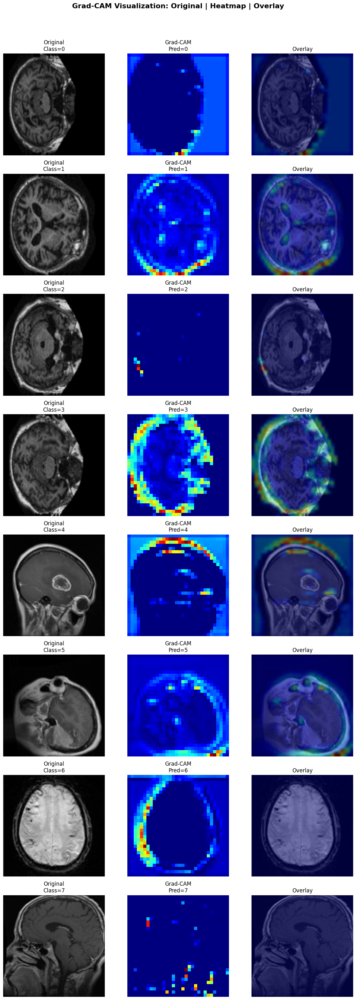

✅ Grad-CAM figure saved as 'gradcam_all_classes.png'


In [33]:
# -----------------------
# Full A-Z Grad-CAM Visualization
# -----------------------
import os
import time
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import label_binarize

# ------------------------
# SETTINGS
# ------------------------
dataset_dir = "/kaggle/input/alz-b-1100/alzheimer_new_11/alzheimer_new"  # change as needed
img_size = (128, 128)
expected_classes = 8

# ------------------------
# LOAD DATA
# ------------------------
X, y = [], []
class_names = sorted([d for d in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, d))])
print("Classes found:", class_names)

if len(class_names) != expected_classes:
    raise ValueError(f"Expected {expected_classes} classes, found {len(class_names)}")

for idx, class_name in enumerate(class_names):
    class_path = os.path.join(dataset_dir, class_name)
    for root, _, files in os.walk(class_path):
        for file in files:
            try:
                img = Image.open(os.path.join(root, file)).convert('RGB')
                img = img.resize(img_size)
                X.append(np.array(img, dtype=np.float32)/255.0)
                y.append(idx)
            except:
                continue

X, y = np.array(X), np.array(y)
print(f"Loaded dataset: X={X.shape}, y={y.shape}")

# ------------------------
# TRAIN/VAL SPLIT
# ------------------------
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# ------------------------
# MODEL DEFINITION
# ------------------------
input_shape = (128, 128, 3)
patch_size = 16
num_patches = (input_shape[0]//patch_size)*(input_shape[1]//patch_size)
projection_dim = 64
transformer_layers = 4
num_heads = 8
num_classes = expected_classes

class Patches(layers.Layer):
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size
    def call(self, images):
        batch = tf.shape(images)[0]
        patches = tf.image.extract_patches(images=images,
                                           sizes=[1,self.patch_size,self.patch_size,1],
                                           strides=[1,self.patch_size,self.patch_size,1],
                                           rates=[1,1,1,1],
                                           padding='VALID')
        patches = tf.reshape(patches, [batch, -1, patches.shape[-1]])
        return patches

class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(projection_dim)
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)
    def call(self, patches):
        positions = tf.range(self.num_patches)
        return self.projection(patches) + self.position_embedding(positions)

def build_hybrid_model():
    inputs = layers.Input(shape=input_shape)
    # CNN branch
    x_cnn = layers.Conv2D(32,(3,3),activation='relu',padding='same')(inputs)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(64,(3,3),activation='relu',padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(128,(3,3),activation='relu',padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Flatten()(x_cnn)
    # ViT + GRU branch
    patches = Patches(patch_size)(inputs)
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)
    for _ in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads,key_dim=projection_dim)(x1,x1)
        x2 = layers.Add()([attention_output, encoded_patches])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        encoded_patches = layers.Add()([x3, x2])
    x_vit = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    x_vit = layers.Flatten()(x_vit)
    x_vit = layers.Reshape((-1, x_vit.shape[-1]))(x_vit)
    x_vit = layers.GRU(256)(x_vit)
    # Concatenate
    x = layers.concatenate([x_cnn, x_vit])
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.003)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

model = build_hybrid_model()
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

# ------------------------
# TRAIN MODEL
# ------------------------
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=64)

# ------------------------
# GRAD-CAM FUNCTIONS
# ------------------------
def find_last_conv_layer(model):
    for layer in reversed(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    return None

def make_gradcam_heatmap(model, img_array, last_conv_layer_name, class_index=None):
    img_tensor = tf.expand_dims(img_array,0)
    last_conv_layer = model.get_layer(last_conv_layer_name)
    grad_model = tf.keras.models.Model([model.inputs],[last_conv_layer.output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_tensor)
        if class_index is None:
            class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)
    heatmap = tf.maximum(heatmap,0)/(tf.math.reduce_max(heatmap)+1e-9)
    return heatmap.numpy()

def overlay_gradcam_on_image(image, heatmap, alpha=0.4):
    heatmap_uint8 = np.uint8(255*heatmap)
    jet = plt.cm.jet(heatmap_uint8/255.0)[:,:,:3]
    jet_resized = tf.image.resize(jet, (image.shape[0], image.shape[1])).numpy()
    overlay = image*(1-alpha) + jet_resized*alpha
    return np.clip(overlay,0,1)

# ------------------------
# PLOT ALL CLASSES IN ONE FIGURE
# ------------------------
last_conv_name = find_last_conv_layer(model)
fig, axs = plt.subplots(expected_classes,3,figsize=(12,expected_classes*4))
fig.suptitle("Grad-CAM Visualization: Original | Heatmap | Overlay", fontsize=16, weight='bold')

for class_idx in range(expected_classes):
    class_indices = np.where(y_val==class_idx)[0]
    if len(class_indices)==0:
        continue
    idx = np.random.choice(class_indices)
    img = X_val[idx]
    true_label = y_val[idx]
    preds = model.predict(np.expand_dims(img,0))
    pred_label = int(np.argmax(preds[0]))

    heatmap = make_gradcam_heatmap(model,img,last_conv_name,class_index=pred_label)
    overlay = overlay_gradcam_on_image(img,heatmap,alpha=0.45)

    axs[class_idx,0].imshow(img)
    axs[class_idx,0].set_title(f"Original\nClass={true_label}")
    axs[class_idx,0].axis('off')

    axs[class_idx,1].imshow(heatmap,cmap='jet')
    axs[class_idx,1].set_title(f"Grad-CAM\nPred={pred_label}")
    axs[class_idx,1].axis('off')

    axs[class_idx,2].imshow(overlay)
    axs[class_idx,2].set_title("Overlay")
    axs[class_idx,2].axis('off')

plt.tight_layout(rect=[0,0,1,0.96])
plt.savefig("gradcam_all_classes.png",dpi=300)
plt.show()
print("✅ Grad-CAM figure saved as 'gradcam_all_classes.png'")


In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from PIL import Image

# ------------------------
# SETTINGS
# ------------------------
dataset_dir = "/path/to/your/dataset"  # change this to your dataset path
img_size = (128, 128)
expected_classes = 8  # adjust this depending on your dataset

# ------------------------
# LOAD DATA
# ------------------------
X, y = [], []
class_names = sorted([d for d in os.listdir(dataset_dir) if os.path.isdir(os.path.join(dataset_dir, d))])
print("Classes found:", class_names)

if len(class_names) != expected_classes:
    raise ValueError(f"Expected {expected_classes} classes, found {len(class_names)}")

for idx, class_name in enumerate(class_names):
    class_path = os.path.join(dataset_dir, class_name)
    for root, _, files in os.walk(class_path):
        for file in files:
            try:
                img = Image.open(os.path.join(root, file)).convert('RGB')
                img = img.resize(img_size)
                X.append(np.array(img, dtype=np.float32)/255.0)
                y.append(idx)
            except:
                continue

X, y = np.array(X), np.array(y)
print(f"Loaded dataset: X={X.shape}, y={y.shape}")

# ------------------------
# TRAIN/VAL SPLIT
# ------------------------
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

# ------------------------
# MODEL DEFINITION
# ------------------------
input_shape = (128, 128, 3)
patch_size = 16
num_patches = (input_shape[0]//patch_size)*(input_shape[1]//patch_size)
projection_dim = 64
transformer_layers = 4
num_heads = 8
num_classes = expected_classes

class Patches(layers.Layer):
    def __init__(self, patch_size):
        super().__init__()
        self.patch_size = patch_size
    def call(self, images):
        batch = tf.shape(images)[0]
        patches = tf.image.extract_patches(images=images,
                                           sizes=[1,self.patch_size,self.patch_size,1],
                                           strides=[1,self.patch_size,self.patch_size,1],
                                           rates=[1,1,1,1],
                                           padding='VALID')
        patches = tf.reshape(patches, [batch, -1, patches.shape[-1]])
        return patches

class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super().__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(projection_dim)
        self.position_embedding = layers.Embedding(input_dim=num_patches, output_dim=projection_dim)
    def call(self, patches):
        positions = tf.range(self.num_patches)
        return self.projection(patches) + self.position_embedding(positions)

def build_hybrid_model():
    inputs = layers.Input(shape=input_shape)
    # CNN branch
    x_cnn = layers.Conv2D(32,(3,3),activation='relu',padding='same')(inputs)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(64,(3,3),activation='relu',padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(128,(3,3),activation='relu',padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Flatten()(x_cnn)
    # ViT + GRU branch
    patches = Patches(patch_size)(inputs)
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)
    for _ in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        attention_output = layers.MultiHeadAttention(num_heads=num_heads,key_dim=projection_dim)(x1,x1)
        x2 = layers.Add()([attention_output, encoded_patches])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        encoded_patches = layers.Add()([x3, x2])
    x_vit = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    x_vit = layers.Flatten()(x_vit)
    x_vit = layers.Reshape((-1, x_vit.shape[-1]))(x_vit)
    x_vit = layers.GRU(256)(x_vit)
    # Concatenate
    x = layers.concatenate([x_cnn, x_vit])
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.003)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

model = build_hybrid_model()
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
model.summary()

# ------------------------
# TRAIN MODEL
# ------------------------
history = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=64)

# ------------------------
# GRAD-CAM FUNCTIONS
# ------------------------
def find_last_conv_layer(model):
    for layer in reversed(model.layers):
        if isinstance(layer, tf.keras.layers.Conv2D):
            return layer.name
    return None

def make_gradcam_heatmap(model, img_array, last_conv_layer_name, class_index=None):
    img_tensor = tf.expand_dims(img_array,0)
    last_conv_layer = model.get_layer(last_conv_layer_name)
    grad_model = tf.keras.models.Model([model.inputs],[last_conv_layer.output, model.output])
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_tensor)
        if class_index is None:
            class_index = tf.argmax(predictions[0])
        loss = predictions[:, class_index]
    grads = tape.gradient(loss, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0,1,2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)
    heatmap = tf.maximum(heatmap,0)/(tf.math.reduce_max(heatmap)+1e-9)
    return heatmap.numpy()

def overlay_gradcam_on_image(image, heatmap, alpha=0.4):
    heatmap_uint8 = np.uint8(255*heatmap)
    jet = plt.cm.jet(heatmap_uint8/255.0)[:,:,:3]
    jet_resized = tf.image.resize(jet, (image.shape[0], image.shape[1])).numpy()
    overlay = image*(1-alpha) + jet_resized*alpha
    return np.clip(overlay,0,1)

# ------------------------
# PLOT ALL CLASSES IN ONE FIGURE
# ------------------------
last_conv_name = find_last_conv_layer(model)
fig, axs = plt.subplots(expected_classes,3,figsize=(12,expected_classes*4))
fig.suptitle("Grad-CAM Visualization: Original | Heatmap | Overlay", fontsize=16, weight='bold')

for class_idx in range(expected_classes):
    class_indices = np.where(y_val==class_idx)[0]
    if len(class_indices)==0:
        continue
    idx = np.random.choice(class_indices)
    img = X_val[idx]
    true_label = y_val[idx]
    preds = model.predict(np.expand_dims(img,0))
    pred_label = int(np.argmax(preds[0]))

    heatmap = make_gradcam_heatmap(model,img,last_conv_name,class_index=pred_label)
    overlay = overlay_gradcam_on_image(img,heatmap,alpha=0.45)

    axs[class_idx,0].imshow(img)
    axs[class_idx,0].set_title(f"Original\nClass={true_label}")
    axs[class_idx,0].axis('off')

    axs[class_idx,1].imshow(heatmap,cmap='jet')
    axs[class_idx,1].set_title(f"Grad-CAM\nPred={pred_label}")
    axs[class_idx,1].axis('off')

    axs[class_idx,2].imshow(overlay)
    axs[class_idx,2].set_title("Overlay")
    axs[class_idx,2].axis('off')

plt.tight_layout(rect=[0,0,1,0.96])
plt.savefig("gradcam_all_classes.png",dpi=300)
plt.show()
print("✅ Grad-CAM figure saved as 'gradcam_all_classes.png'")


In [34]:
# LIME

Train: (7040, 128, 128, 3), Val: (1760, 128, 128, 3)


Model: "functional_29"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_13      │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling_11        │ (None, 128, 128,  │          0 │ input_layer_13[0… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patches_13          │ (None, None, 768) │          0 │ rescaling_11[0][… │
│ (Patches)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ patch_encoder_13    │ (None, 64, 64)    │     53,312 │ patches_13[0][0]  │
│ (PatchEncoder)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ patch_encoder_13… │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_104 (Add)       │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ patch_encoder_13… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_104[0][0]     │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_105 (Add)       │ (None, 64, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ add_104[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_105[0][0]     │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_106 (Add)       │ (None, 64, 64)    │          0 │ multi_head_atten… │
│                     │                   │            │ add_105[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_106[0][0]     │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_107 (Add)       │ (None, 64, 64)    │          0 │ layer_normalizat… │
│                     │                   │            │ add_106[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ layer_normalizatio… │ (None, 64, 64)    │        128 │ add_107[0][0]     │
│ (LayerNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ multi_head_attenti… │ (None, 64, 64)    │    132,672 │ layer_normalizat… │
│ (MultiHeadAttentio… │                   │            │ layer_normalizat… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_108 (Add)       │ (None, 64, 64)    │          0 │ multi_head_atten

 Total params: 12,478,728 (47.60 MB)

 Trainable params: 12,478,728 (47.60 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/3
220/220 ━━━━━━━━━━━━━━━━━━━━ 24s 44ms/step - accuracy: 0.7072 - loss: 0.8206 - val_accuracy: 0.9812 - val_loss: 0.0717
Epoch 2/3
220/220 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - accuracy: 0.9838 - loss: 0.0551 - val_accuracy: 0.9795 - val_loss: 0.0820
Epoch 3/3
220/220 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - accuracy: 0.9874 - loss: 0.0471 - val_accuracy: 0.9886 - val_loss: 0.0396


  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  20%|██        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  60%|██████    | 3/5 [00:25<00:11,  5.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  80%|████████  | 4/5 [00:37<00:08,  8.47s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 5/5 [00:47<00:00,  8.79s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 6it [00:59, 11.83s/it]                       


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 797ms/step
Image 0 predicted as class 3


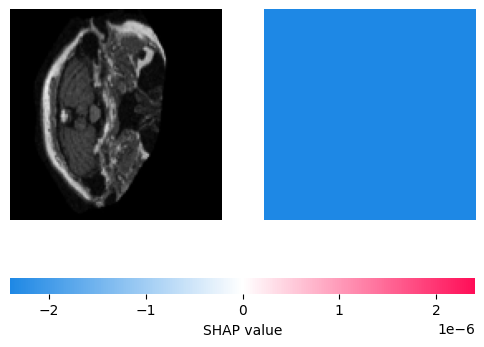

Image 1 predicted as class 0


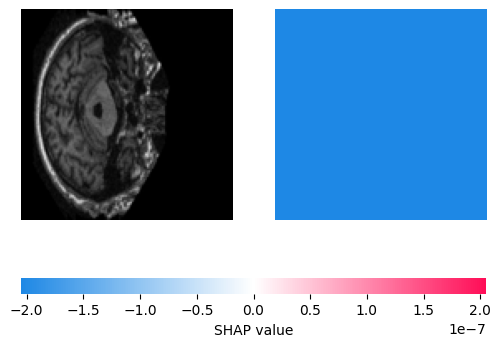

Image 2 predicted as class 3


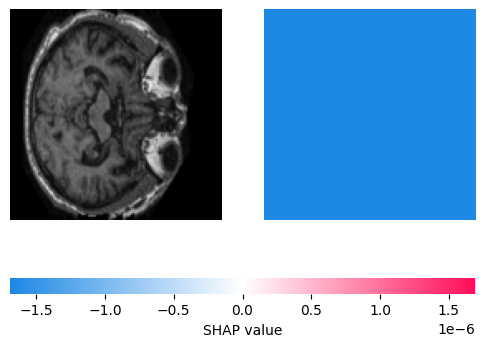

Image 3 predicted as class 0


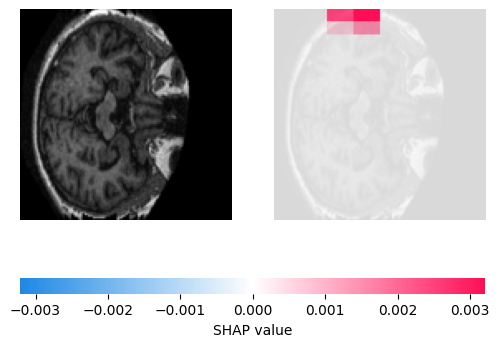

Image 4 predicted as class 6


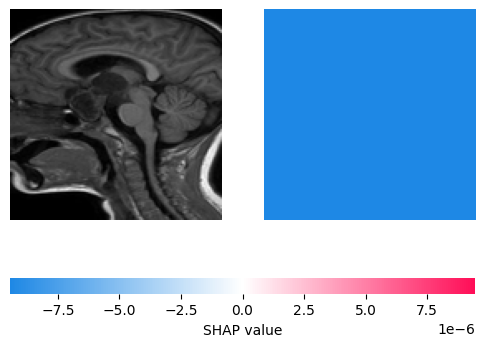

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━

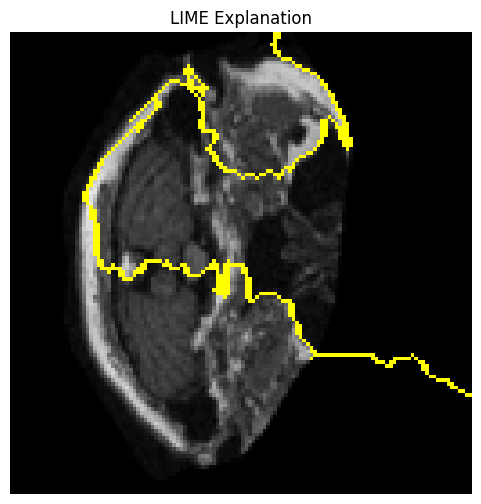

In [35]:
# =========================================
# 1. Imports
# =========================================
import numpy as np
import matplotlib.pyplot as plt
import shap
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split

# For LIME
from lime import lime_image
from skimage.segmentation import mark_boundaries

# =========================================
# 2. Dataset split
# =========================================
# Assuming X, y already loaded (images & labels)
X_train, X_val, y_train, y_val = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

print(f"Train: {X_train.shape}, Val: {X_val.shape}")

# =========================================
# 3. Model Definition (Hybrid CNN + ViT + GRU)
# =========================================
input_shape = (128, 128, 3)
patch_size = 16
num_patches = (input_shape[0] // patch_size) * (input_shape[1] // patch_size)
projection_dim = 64
transformer_layers = 4
num_heads = 8
num_classes = 8

# ---- Patches Layer ----
class Patches(layers.Layer):
    def __init__(self, patch_size):
        super(Patches, self).__init__()
        self.patch_size = patch_size

    def call(self, images):
        batch_size = tf.shape(images)[0]
        patches = tf.image.extract_patches(
            images=images,
            sizes=[1, self.patch_size, self.patch_size, 1],
            strides=[1, self.patch_size, self.patch_size, 1],
            rates=[1, 1, 1, 1],
            padding="VALID",
        )
        patch_dims = patches.shape[-1]
        patches = tf.reshape(patches, [batch_size, -1, patch_dims])
        return patches

# ---- Patch Encoder ----
class PatchEncoder(layers.Layer):
    def __init__(self, num_patches, projection_dim):
        super(PatchEncoder, self).__init__()
        self.num_patches = num_patches
        self.projection = layers.Dense(units=projection_dim)
        self.position_embedding = layers.Embedding(
            input_dim=num_patches, output_dim=projection_dim
        )

    def call(self, patches):
        positions = tf.range(start=0, limit=self.num_patches, delta=1)
        encoded = self.projection(patches) + self.position_embedding(positions)
        return encoded

# ---- Build Hybrid Model ----
def build_hybrid_model():
    inputs = layers.Input(shape=input_shape)

    # CNN Branch
    x_cnn = layers.Conv2D(32, (3,3), activation='relu', padding='same')(inputs)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(64, (3,3), activation='relu', padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Conv2D(128, (3,3), activation='relu', padding='same')(x_cnn)
    x_cnn = layers.MaxPooling2D((2,2))(x_cnn)
    x_cnn = layers.Flatten()(x_cnn)

    # ViT + GRU Branch
    x_vit = layers.Rescaling(1./255)(inputs)
    patches = Patches(patch_size)(x_vit)
    encoded_patches = PatchEncoder(num_patches, projection_dim)(patches)

    for _ in range(transformer_layers):
        x1 = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
        attention_output = layers.MultiHeadAttention(
            num_heads=num_heads, key_dim=projection_dim, dropout=0.2
        )(x1, x1)
        x2 = layers.Add()([attention_output, encoded_patches])
        x3 = layers.LayerNormalization(epsilon=1e-6)(x2)
        encoded_patches = layers.Add()([x3, x2])

    x_vit = layers.LayerNormalization(epsilon=1e-6)(encoded_patches)
    x_vit = layers.Dropout(0.02)(x_vit)
    x_vit = layers.Flatten()(x_vit)
    x_vit = layers.Reshape((-1, x_vit.shape[-1]))(x_vit)
    x_vit = layers.GRU(256)(x_vit)

    # Concatenate CNN + ViT-GRU
    x = layers.concatenate([x_cnn, x_vit])
    x = layers.Dense(256, activation='relu')(x)
    x = layers.Dropout(0.03)(x)
    outputs = layers.Dense(num_classes, activation='softmax')(x)

    model = keras.Model(inputs=inputs, outputs=outputs)
    return model

model = build_hybrid_model()
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.summary()

# =========================================
# 4. Train (quick)
# =========================================
history = model.fit(
    X_train, y_train,
    validation_data=(X_val, y_val),
    epochs=3,
    batch_size=32
)

# =========================================
# 5. SHAP Explanations
# =========================================
masker = shap.maskers.Image("inpaint_telea", X_train[0].shape)
explainer = shap.Explainer(model, masker, output_names=[f"class_{i}" for i in range(num_classes)])
test_images = X_val[:5]
shap_values = explainer(test_images)

preds = model.predict(test_images)
pred_classes = np.argmax(preds, axis=1)

for i, img in enumerate(test_images):
    class_idx = pred_classes[i]
    print(f"Image {i} predicted as class {class_idx}")
    shap.image_plot(shap_values.values[..., class_idx][i:i+1], img[np.newaxis])


# =========================================
# 6. LIME Explanation
# =========================================
explainer_lime = lime_image.LimeImageExplainer()

# Explain one sample (change index)
idx = 0
image = X_val[idx]

# LIME needs a predict function
def predict_fn(images):
    images = np.array(images)
    return model.predict(images)

explanation = explainer_lime.explain_instance(
    image,
    predict_fn,
    top_labels=1,
    hide_color=0,
    num_samples=1000
)

# Get mask + highlighted region
temp, mask = explanation.get_image_and_mask(
    explanation.top_labels[0],
    positive_only=True,
    num_features=5,
    hide_rest=False
)

plt.figure(figsize=(6,6))
plt.imshow(mark_boundaries(temp, mask))
plt.title("LIME Explanation")
plt.axis("off")
plt.show()
